# Streaming Data Management and Time Series Analysis
###### Assignment 1

> **Cognome**: Filosa    **Nome**: Alberto
>
> **Matricola**: 815589
>
> **Anno Accademico**: 2020/2021
>
> **Facoltà**: Dipartimento di Informatica, Sistemi e Comunicazione (DISCO)
>
> **Corso di Laurea Magistrale**: Data Science
>
> **e-mail**: a.filosa1@campus.unimib.it

## Librerie

In [2]:
library("tidyverse")

── Attaching packages ─────────────────────────────────────── tidyverse 1.3.0 ──

✔ ggplot2 3.3.2     ✔ purrr   0.3.4
✔ tibble  3.0.4     ✔ dplyr   1.0.2
✔ tidyr   1.1.2     ✔ stringr 1.4.0
✔ readr   1.4.0     ✔ forcats 0.5.0

── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()



In [5]:
#-- Package names
packages <- c("xts", "forecast", "keras", "dygraphs",
              "KFAS", "lubridate", "urca", "ggpubr",
              "ggplot2", "ModelMetrics", "tsfknn", "DMwR")

#-- Install Packages not yet Installed
installed_packages <- packages %in% rownames(installed.packages())
if (any(installed_packages == FALSE)) {
  install.packages(packages[!installed_packages])
    }

#-- Packages loading
lapply(packages, library, character.only = TRUE) %>%
invisible()

## Lettura File

In [7]:
ts <- read_csv2("TrainingSet.csv")
ts <- ts %>%
      rename(Data = DATA,
             Valore = VALORE) #-- Rinomina Colonne

head(ts)

ℹ Using ',' as decimal and '.' as grouping mark. Use `read_delim()` for more control.


── Column specification ────────────────────────────────────────────────────────
cols(
  DATA = col_date(format = ""),
  Ora = col_double(),
  VALORE = col_double()
)




Data,Ora,Valore
<date>,<dbl>,<dbl>
2018-09-01,1,3646742
2018-09-01,2,3273110
2018-09-01,3,3069245
2018-09-01,4,2969621
2018-09-01,5,2944116
2018-09-01,6,3022310


## Analisi Esplorativa

In [8]:
summary(ts)

      Data                 Ora            Valore       
 Min.   :2018-09-01   Min.   : 1.00   Min.   :1796490  
 1st Qu.:2019-03-02   1st Qu.: 7.00   1st Qu.:3156970  
 Median :2019-08-31   Median :13.00   Median :4187692  
 Mean   :2019-08-31   Mean   :12.50   Mean   :4235628  
 3rd Qu.:2020-03-01   3rd Qu.:18.75   3rd Qu.:5147029  
 Max.   :2020-08-31   Max.   :24.00   Max.   :9099482  

### Missing Values

In [9]:
sapply(ts, function(x)(sum(is.na(x))))

Data    Ora Valore 
     0      0      0

### Ora Legale

In [10]:
ts %>%
  group_by(Ora)                %>% #-- Raggruppamento
  summarise(n())               %>% #-- Somma per Righe
  rename(Hour = "Ora",
        `Month Hours` = "n()") %>% #-- Rinomina Colonne
  filter(`Month Hours` != 730)     #-- Filtro Valori diversi da 24h * 30g

`summarise()` ungrouping output (override with `.groups` argument)



Hour,Month Hours
<dbl>,<int>
3,728


Si osserva che i cambiamenti dell'ora legale nel 2018 e 2019 a Marzo. Si identificano i giorni e le ore di cambiamento d'orario:

In [11]:
ts %>%
  group_by(year(date(Data)),
           month(date(Data)),
           day(date(Data)))          %>% #-- Raggruppamento
  summarise(n())                     %>% #-- Somma per Righe
  filter(`n()` == 23)                %>% #-- Filtro (Ora Legale)
  rename(Year = "year(date(Data))",
        Month = "month(date(Data))",
        Day = "day(date(Data))",
        `Day Hours` = "n()")             #-- Rinomina Colonne

`summarise()` regrouping output by 'year(date(Data))', 'month(date(Data))' (override with `.groups` argument)



Year,Month,Day,Day Hours
<dbl>,<dbl>,<int>,<int>
2019,3,31,23
2020,3,29,23


Si imputano a mano i valori delle ore precedenti:

In [12]:
ts_legale <- tribble(~Data, ~Ora, ~Valore,
                     "2019-03-31", 3, 3039997,
                     "2020-03-29", 3, 2329514) %>%
              mutate(Data = as.Date(Data))

### Grafici

In [13]:
ymdhms <- ymd_hms(paste(ts$Data,                   #-- Date
                        " ",                       #-- Space
                        hms::hms(hours = ts$Ora))) #-- Hour

dyn_ts <- xts::xts(x = ts$Valore,     #-- Value to Plot
                   order.by = ymdhms) #-- Concatenate Date and Hours
colnames(dyn_ts) <- c("Valore")

#-- Train & Validation
dyn_train <- dyn_ts[1:as.integer(nrow(dyn_ts)*0.8), ]/1000000
dyn_validation <- dyn_ts[(1 + as.integer(nrow(dyn_ts)*0.8)) : nrow(dyn_ts), ]/1000000

dyn_all <- cbind(dyn_train,
                 dyn_validation)
colnames(dyn_all) <- c("Train",
                       "Validation")

In [28]:
options(repr.plot.width = 13,
        repr.plot.height = 6.5)

dygraph(dyn_all)                             %>%
  dySeries("Train",
           label = "Train")                  %>% #-- Train Dataset
  dySeries("Validation",
           label = "Validation")             %>% #-- Validation Dataset
  dyOptions(drawPoints = TRUE,                   #-- Draw Points
            pointSize = 0.5,                     #-- Size of Points
            colors = c("#0077b6",
                       "#c44536"))               %>% #-- Colori
  dyAxis("y", label = "Valore (in Milioni)") %>% #-- Asse Y
  dyAxis("x", label = "Periodo",
         drawGrid = FALSE)                   %>% #-- Asse X
  dyRangeSelector(height = 20)                   #-- Slider

#### Funzione Grafico

In [29]:
plot_val <- function(prediction, title){
  
  autoplot(train_arima,
           main = title,                          #-- Titolo
           xlab = "Periodo",                      #-- Label X
           ylab = "Valore (in Milioni)",
           col = "#0077b6")        + #-- Label Y
    autolayer(validation_arima,                   
              series = "Reale")                 + #-- Validation
    autolayer(prediction,
              series = "Previsione")            + #-- Previsione
    scale_y_continuous(breaks = c(-2, 0, 2, 4),   
                       labels = c(2, 4, 6, 8))  + #-- Interruzioni
    scale_color_manual(values = c("#248232",
                                  "#c81d25"))   + #-- Colori
    labs(color = "Validation")                  + #-- Legenda
    theme_bw()                                    #-- Tema
}

#### Stagionalità Giornaliera

In [30]:
ts_daily <- ts                   %>% #-- Serie Storica
            bind_rows(ts_legale) %>% #-- Concatenazione con Ora Legale
            arrange(Data)        %>% #-- Ordinamento per Sistemare Ora Legale
            ts(frequency = 24)       #-- Oggetto `ts()` con Frequenza Giornaliera

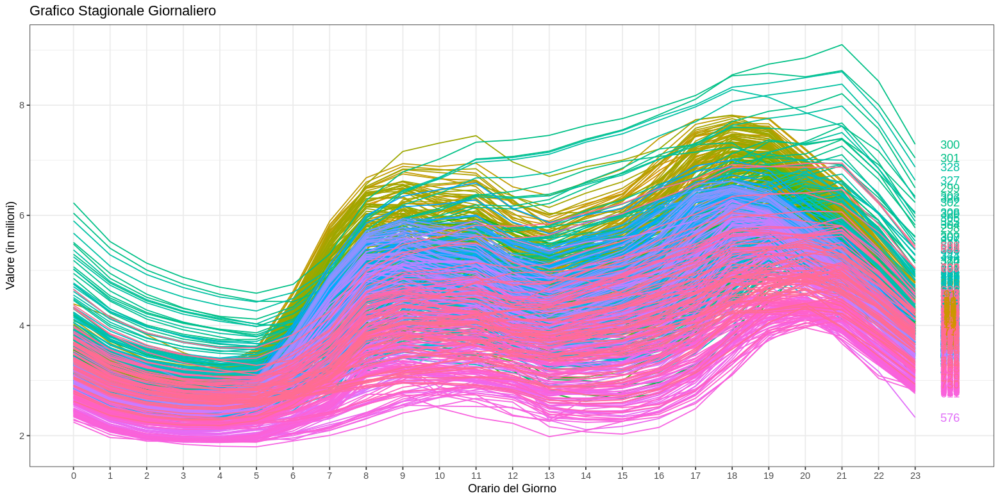

In [31]:
ggseasonplot(ts_daily[, "Valore"],                      #-- Stagionalità Giornaliera
             year.labels = TRUE,                        #-- Etichetta
             year.labels.left = FALSE,                  #-- Etichetta
             ylab = "Valore (in milioni)",              #-- Etichetta Asse Y
             xlab = "Orario del Giorno",                #-- Etichetta Asse X
             main = "Grafico Stagionale Giornaliero") + #-- Titolo
  theme(axis.text.y = element_text(face = "bold"),      #-- Grassetto per Asse Y
        axis.text.x = element_text(face = "bold",       #-- Grassetto per Asse X
                                   angle = 45))       + #-- 45°
  scale_y_continuous(breaks = c(2000000,
                                4000000,
                                6000000,
                                8000000),               #-- Interruzioni
                     labels = c(2, 4, 6, 8))          + #-- Etichetta
  theme_bw()                                            #-- Tema

Si osserva dal grafico che esiste una stagionalità giornaliera. In particolare, i valori aumentano nelle ore del giorno lavorativo e diminuiscono nella pausa pranzo, a fine orario lavorativo e di notte.

#### Stagionalità Settimanale

In [32]:
ts_weekly <- ts                   %>% #-- Serie Storica
             bind_rows(ts_legale) %>% #-- Concatenazione con Ora Legale
             arrange(Data)        %>% #-- Ordinamento per Sistemare Ora Legale
             ts(frequency = 24*7)     #-- Oggetto `ts()` con Frequenza Settimanale

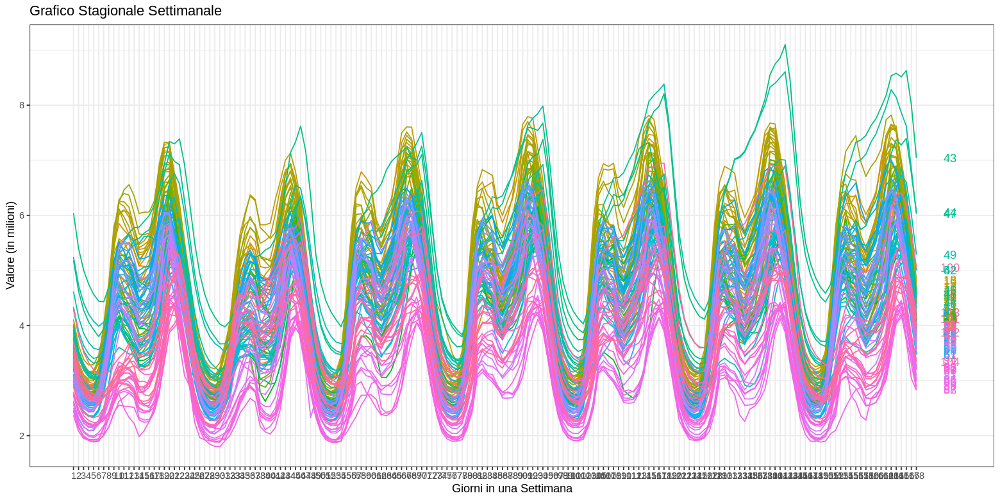

In [33]:
ggseasonplot(ts_weekly[, "Valore"],                     #-- Stagionalità Settimanale
             year.labels = TRUE,                        #-- Etichetta
             year.labels.left = FALSE,                  #-- Etichetta
             ylab = "Valore (in milioni)",              #-- Etichetta Asse Y
             xlab = "Giorni in una Settimana",          #-- Etichetta Asse X
             main = "Grafico Stagionale Settimanale") + #-- Titolo
  theme(axis.text.y = element_text(face = "bold"),      #-- Grassetto per Asse Y
        axis.text.x = element_text(face = "bold",       #-- Grassetto per Asse X
                                   angle = 45))       + #-- 45°
  scale_y_continuous(breaks = c(2000000,
                                4000000,
                                6000000,
                                8000000),               #-- Interruzioni
                     labels = c(2, 4, 6, 8))          + #-- Etichetta
  theme_bw()                                            #-- Tema

Dal grafico è possibile notare che non è presente alcuna stagionalità settimanale, ma solamente giornaliera, come visto in precedenza.

#### Stagionalità Mensile

In [34]:
ag <- aggregate(Valore ~ Data, ts, mean)

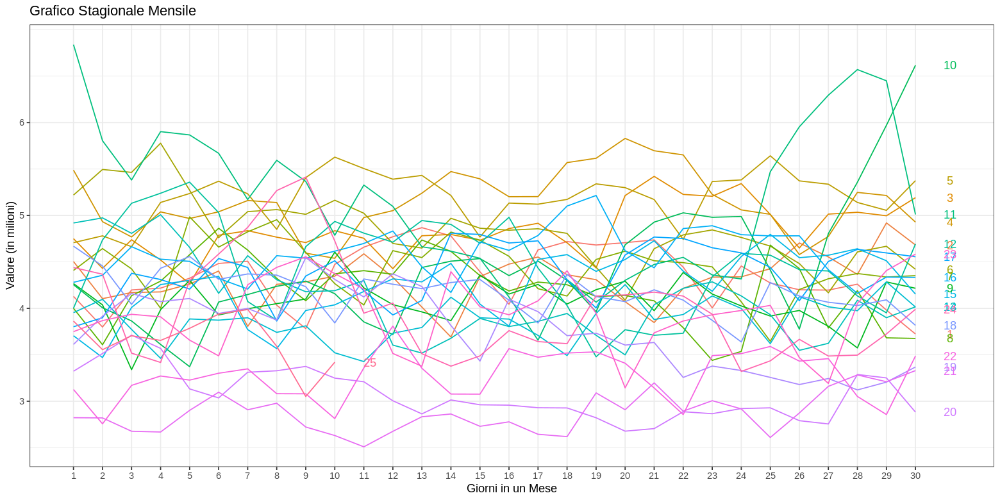

In [35]:
ggseasonplot(ts(ag[,"Valore"], frequency = 30),         #-- Stagionalità Mensile
             year.labels = TRUE,                        #-- Etichetta
             year.labels.left = FALSE,                  #-- Etichetta
             ylab = "Valore (in milioni)",              #-- Etichetta Asse Y
             xlab = "Giorni in un Mese",                #-- Etichetta Asse X
             main = "Grafico Stagionale Mensile") +     #-- Titolo
  theme(axis.text.y = element_text(face = "bold"),      #-- Grassetto per Asse Y
        axis.text.x = element_text(face = "bold",       #-- Grassetto per Asse X
                                   angle = 45))   +     #-- 45°
  scale_y_continuous(breaks = c(3000000,
                                4000000,
                                5000000,
                                6000000),               #-- Interruzioni
                     labels = c(3, 4, 5, 6))      +     #-- Etichetta
  theme_bw()                                            #-- Tema

Dal grafico di stagionalità mensile non si nota alcuna stagionalità mensile.

#### Stagionalità Annuale

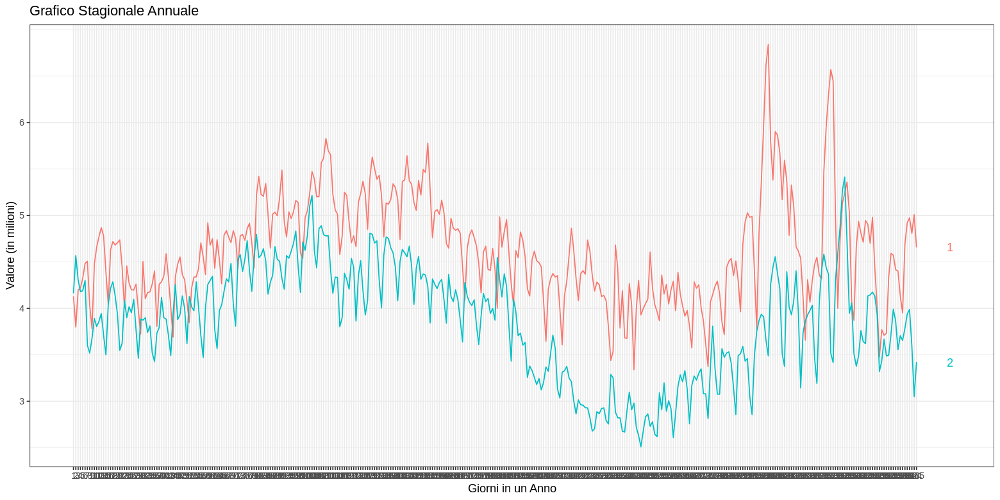

In [36]:
ggseasonplot(ts(ag[,"Valore"], frequency = 730/2),      #-- Stagionalità Annuale
             year.labels = TRUE,                        #-- Etichetta
             year.labels.left = FALSE,                  #-- Etichetta
             ylab = "Valore (in milioni)",              #-- Etichetta Asse Y
             xlab = "Giorni in un Anno",                           #-- Etichetta Asse X
             main = "Grafico Stagionale Annuale") +     #-- Titolo
  theme(axis.text.y = element_text(face = "bold"),      #-- Grassetto per Asse Y
        axis.text.x = element_text(face = "bold",       #-- Grassetto per Asse X
                                   angle = 45))   +     #-- 45°
  scale_y_continuous(breaks = c(3000000,
                                4000000,
                                5000000,
                                6000000),               #-- Interruzioni
                     labels = c(3, 4, 5, 6))      +     #-- Etichetta
  theme_bw()                                            #-- Tema

## Scomposizione Serie Storica

La serie storica si può scomporre nel seguente modo:

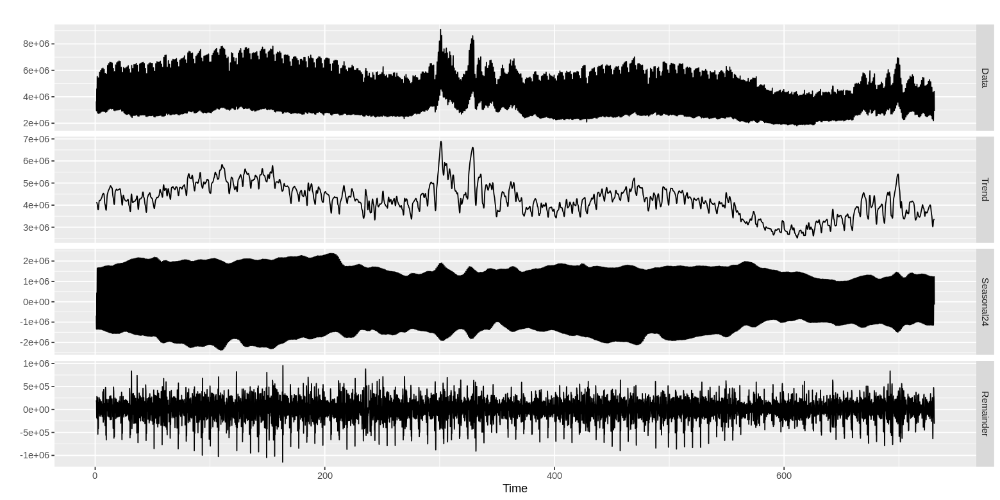

In [37]:
autoplot(mstl(ts(ts$Valore, frequency = 24)))

## Modelli

Mettere i modelli fatti:

* *Seasonal Naive Method*;
* *ARIMA*$(2, 0, 0)(0, 1, 0)_{24h}$
* *ARIMA*$(2, 0, 0)(0, 1, 1)_{24h}$
* *ARIMA*$(3, 0, 0)(0, 1, 0)_{24h}$
* *ARIMA*$(3, 0, 0)(0, 1, 2)_{24h}$
* *ARIMA*$(3, 1, 2)(0, 0, 0)_{24h}$ con regressore di Fourier
* *ARIMA*$(5, 0, 0)(0, 1, 3)_{24h}$
* *ARIMA*$(5, 0, 2)(2, 1, 0)_{24h}$


Inoltre, la serie storica inanzitutto viene standardizzata per ottimizzare l'addestramento dei modelli. Successivamente, essa viene divisa in:

* **Train**: da `2018-09-01` a `2020-04-06 (80% del dataset);
* **Validation**: da `2020-04-07` a `2020-08-31` (20% del dataset).

per prevedere le stime dei valori nel Test nei mesi di Settembre ed Ottobre 2020.

In [38]:
ts_stand <- ts(scale(ts$Valore), #-- Standardizzazione
               frequency = 24,   #-- Frequenza
               start = 1)        #-- Parte da 2018-09-01

train_arima <- ts(ts_stand[1:as.integer(nrow(ts)*0.8), ], #-- Train
                  frequency = 24,                         #-- Frequenza
                  start = 1)                              #-- Parte da 2018-09-01

validation_arima <- ts(ts_stand[(1 + as.integer(nrow(ts)*0.8)) : nrow(ts), ], #-- Validation
                       frequency = 24,                                        #-- Frequenza
                       start = 585)  

Inanzitutto si osservano gli ACF e PACF

Warning message:
“Ignoring unknown parameters: main”
Warning message:
“Ignoring unknown parameters: main”


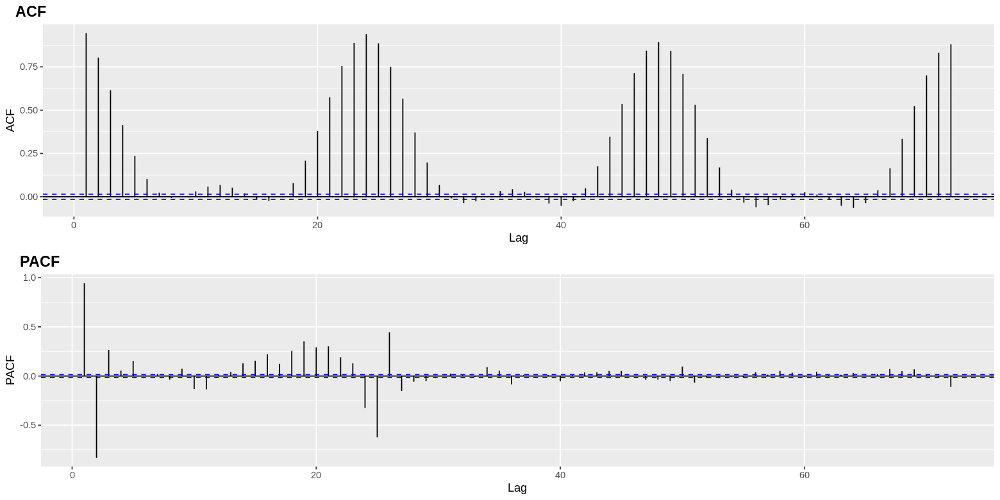

In [39]:
acf  <- ggAcf(ts[, "Valore"],
        lag.max = 72, 
        main = "")
pacf <- ggPacf(ts[, "Valore"],
        lag.max = 72,
        main = "")

ggarrange(acf, pacf,
          labels = c("ACF", "PACF"),
          nrow = 2, ncol = 1)

Osservando il grafico ACF si nota una stagionalità giornaliera. Inoltre, è possibile testare un modello ARIMA con parte autoregressiva ***AR***(2), una parte di integrazione ***I***(1).

Si elimina la stagionalità giornaliera con il comando `diff()` e si testa l'ipotesi che la serie storica sia un White Noise.

In [40]:
train_diff <- diff(train_arima,
                   lag = 24)        %>%
              diff(differences = 1) %>%
              diff(differences = 1)

Box.test(train_diff,
         type='Ljung-Box')


	Box-Ljung test

data:  train_diff
X-squared = 0.35811, df = 1, p-value = 0.5496


Viene respinta l'ipotesi di White Noise. Si osservano i grafici ACF e PACF delle differenze giornaliere:

Warning message:
“Ignoring unknown parameters: main”
Warning message:
“Ignoring unknown parameters: main”


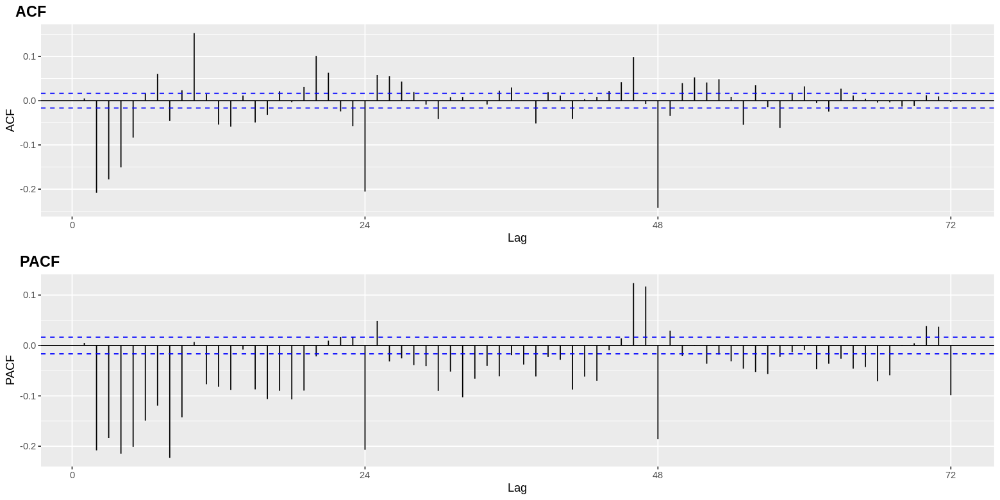

In [41]:
acf_diff  <- ggAcf(train_diff,
                   lag.max = 72,
                   main = "")
pacf_diff <- ggPacf(train_diff,
                    lag.max = 72,
                    main = "")

ggarrange(acf_diff,
          pacf_diff,
          labels = c("ACF", "PACF"),
          nrow = 2, ncol = 1)

### Seasonal Naive Method

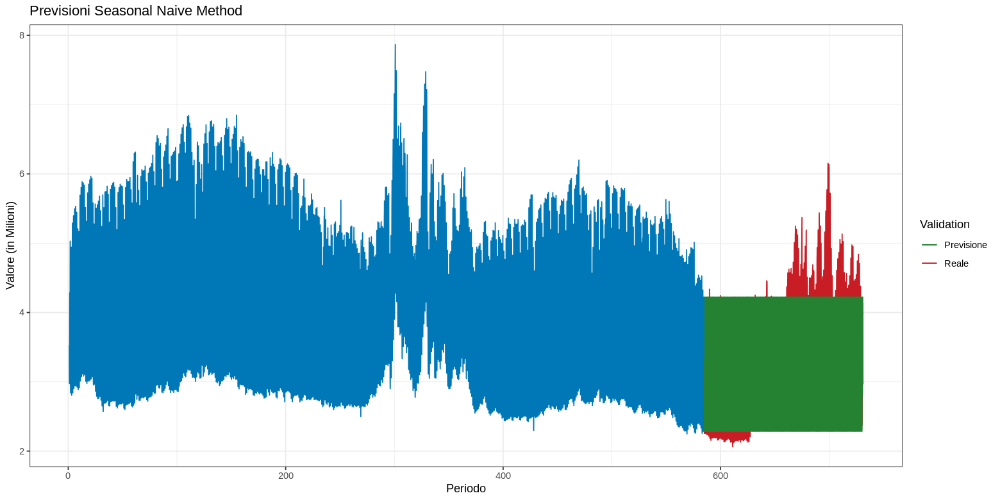

In [42]:
plot_val(snaive(train_arima,
                h = 3504)$mean, "Previsioni Seasonal Naive Method")

In [45]:
naive_mean <- ts(snaive$mean,
                 start = 1,      #-- Partenza
                 frequency = 24) #-- Frequenza Giornaliera

mae_naive <- mean(abs(validation_arima - snaive_mean)) #-- Mean Absolute Error
mae_naive

ERROR: ignored

### ARIMA

#### 1. *ARIMA*$(2, 0, 0)(0, 1, 0)_{24h}$

In [63]:
mod1_arima <- Arima(train_arima,             #-- Data
                    c(2, 0, 0),              #-- ARIMA
                    c(0, 1, 0),              #-- ARIMA Stagionale
                    lambda = "auto",         #-- Coefficiente Lambda
                    include.constant = TRUE) #-- Includere Costante

smod1_arima <- summary(mod1_arima)
smod1_arima[,"MAE"]

Series: train_arima 
ARIMA(2,0,0)(0,1,0)[24] with drift 
Box Cox transformation: lambda= 0.9284836 

Coefficients:
         ar1      ar2   drift
      1.4989  -0.5871  -1e-04
s.e.  0.0068   0.0068   4e-04

sigma^2 estimated as 0.009794:  log likelihood=12508.07
AIC=-25008.14   AICc=-25008.14   BIC=-24977.96

Training set error measures:
                        ME       RMSE        MAE       MPE     MAPE     MASE
Training set -0.0003475957 0.09334378 0.05751714 -1.811796 40.41606 0.253703
                  ACF1
Training set 0.1335195


[1] 0.05751714

Warning message:
“Ignoring unknown parameters: main”
Warning message:
“Ignoring unknown parameters: main”


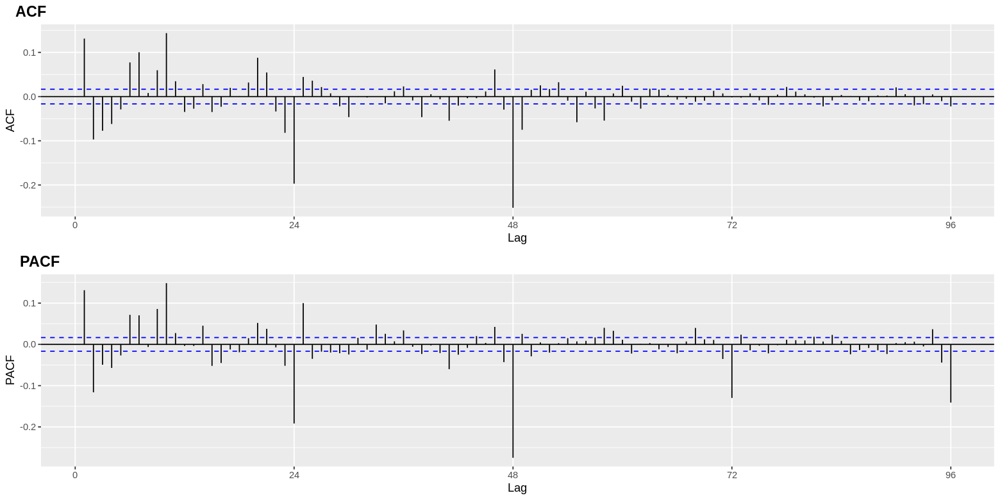

In [64]:
acf_arima1 <- ggAcf(mod1_arima$residuals,
                    lag.max = 96,
                    main = "")
pacf_arima1 <- ggPacf(mod1_arima$residuals,
                      lag.max = 96,
                      main = "")

ggarrange(acf_arima1,
          pacf_arima1,
          labels = c("ACF", "PACF"),
          nrow = 2, ncol = 1)


	Ljung-Box test

data:  Residuals from ARIMA(2,0,0)(0,1,0)[24] with drift
Q* = 3132.4, df = 45, p-value < 2.2e-16

Model df: 3.   Total lags used: 48



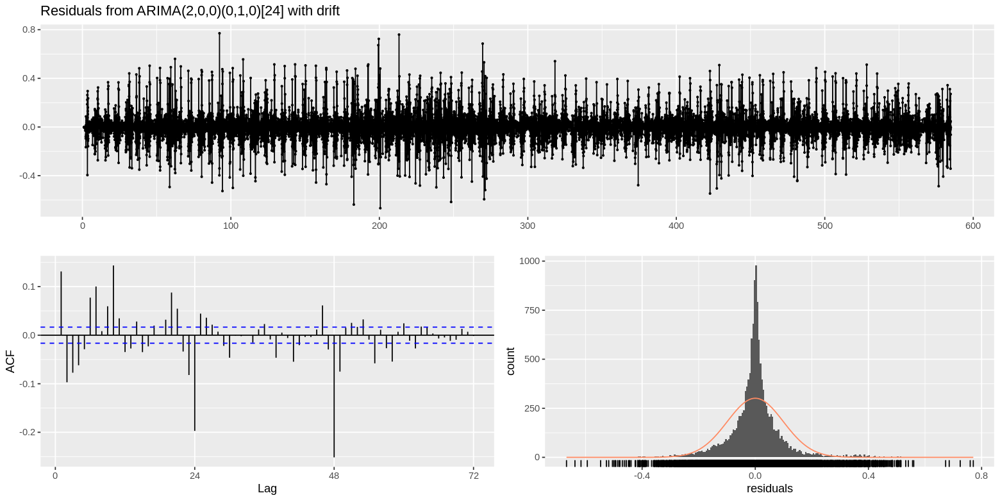

In [65]:
checkresiduals(mod1_arima)

Si osserva una stagionalità in MA in quanto nei grafici ACF e PACF sono presenti lag multipli di 24 superiori all'intervallo di confidenza.

##### Previsioni

In [66]:
pred_val1 <- forecast(mod1_arima,
                      h = 3504)   #-- Numero Validation
pred_val1 <- ts(pred_val1$mean,
                start = 585,
                frequency = 24)

##### Grafico Previsioni

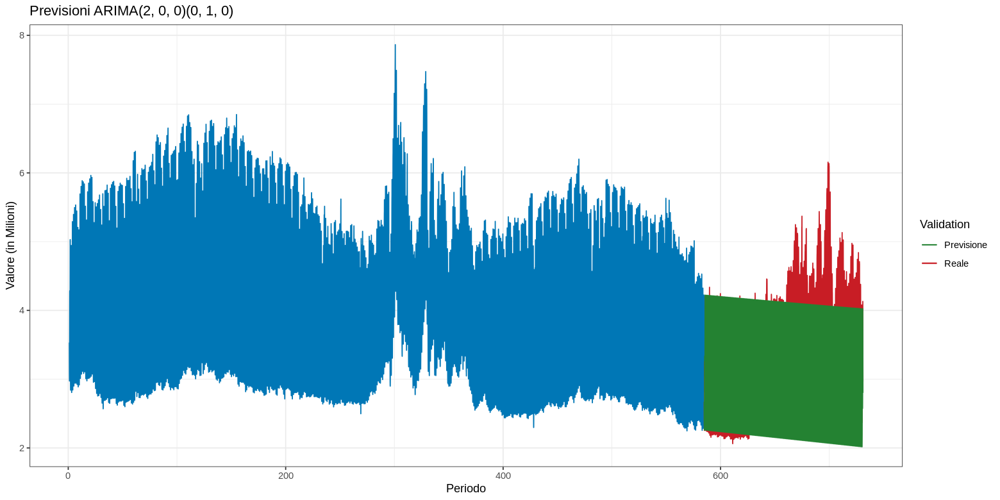

In [67]:
plot_val(pred_val1,
         "Previsioni ARIMA(2, 0, 0)(0, 1, 0)")

##### Mean Absolute Error

In [68]:
mae_mod1_arima <- mean(abs(pred_val1 - validation_arima))
mae_mod1_arima

[1] 0.5661811

#### 2. *ARIMA*$(2, 0, 0)(0, 1, 1)_{24h}$

In [69]:
mod2_arima <- Arima(train_arima,             #-- Data
                    c(2, 0, 0),              #-- ARIMA
                    c(0, 1, 1),              #-- ARIMA Stagionale
                    lambda = "auto",         #-- Coefficiente Lambda
                    include.constant = TRUE) #-- Includere Costante

smod2_arima <- summary(mod2_arima)
smod2_arima[, "MAE"]

Series: train_arima 
ARIMA(2,0,0)(0,1,1)[24] with drift 
Box Cox transformation: lambda= 0.9284836 

Coefficients:
         ar1      ar2     sma1   drift
      1.4865  -0.5583  -0.7431  -1e-04
s.e.  0.0070   0.0070   0.0074   1e-04

sigma^2 estimated as 0.008393:  log likelihood=13578.04
AIC=-27146.07   AICc=-27146.07   BIC=-27108.34

Training set error measures:
                        ME       RMSE        MAE      MPE     MAPE      MASE
Training set -0.0004024634 0.08687467 0.05832183 3.444789 40.44277 0.2572524
                  ACF1
Training set 0.1230219


[1] 0.05832183

Warning message:
“Ignoring unknown parameters: main”
Warning message:
“Ignoring unknown parameters: main”


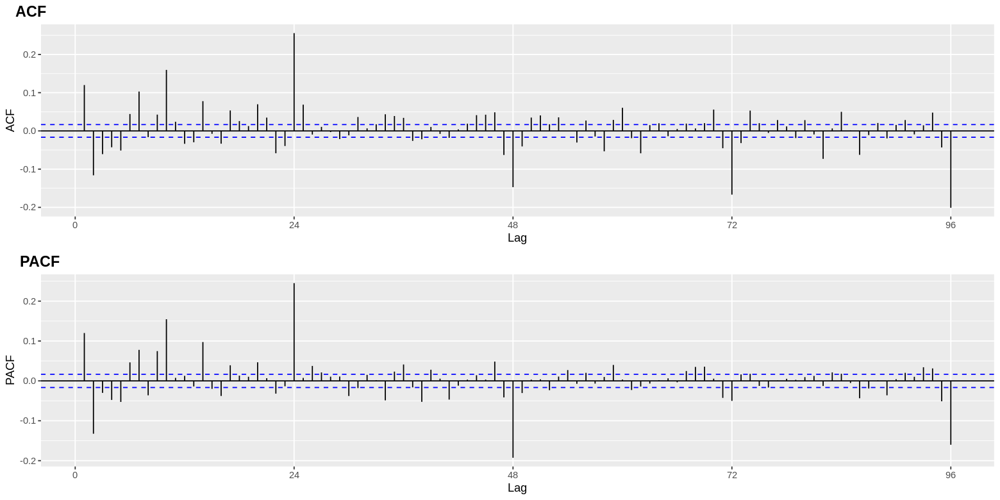

In [70]:
acf_arima2 <- ggAcf(mod2_arima$residuals,
                    lag.max = 96,
                    main = "")
pacf_arima2 <- ggPacf(mod2_arima$residuals,
                      lag.max = 96,
                      main = "")

ggarrange(acf_arima2,
          pacf_arima2,
          labels = c("ACF", "PACF"),
          nrow = 2, ncol = 1)


	Ljung-Box test

data:  Residuals from ARIMA(2,0,0)(0,1,1)[24] with drift
Q* = 2967.8, df = 44, p-value < 2.2e-16

Model df: 4.   Total lags used: 48



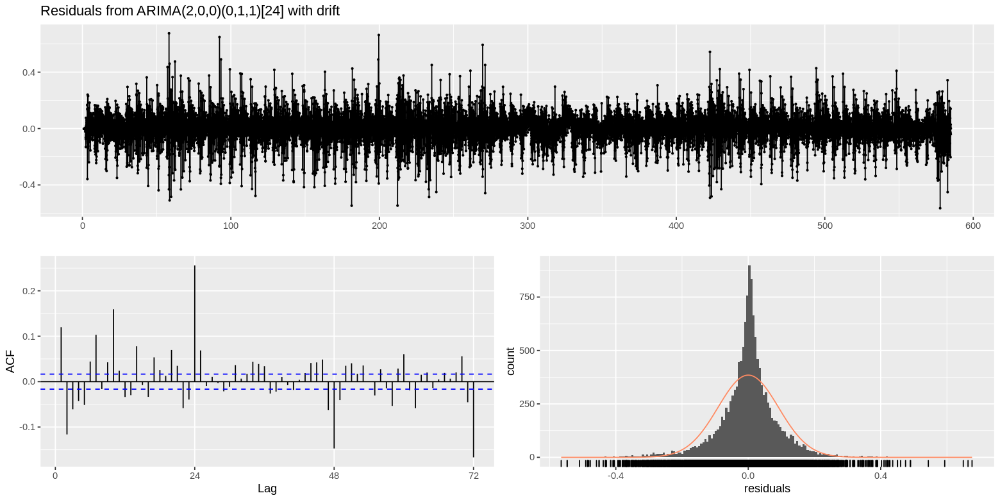

In [71]:
checkresiduals(mod2_arima)

##### Previsioni

In [72]:
pred_val2 <- forecast(mod2_arima,
                      h = 3504)   #-- Dimensione del Validation
pred_val2 <- ts(pred_val2$mean,
                start = 585,
                frequency = 24)

##### Grafico Previsioni

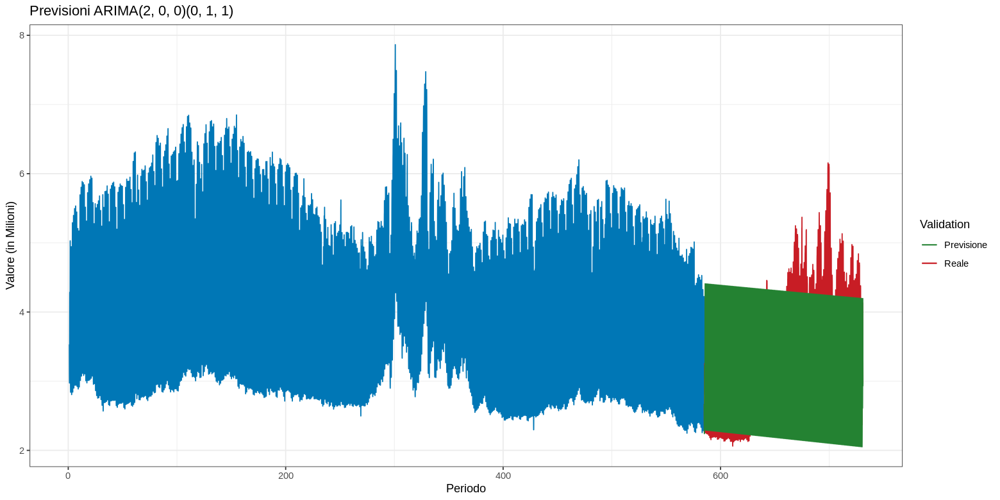

In [73]:
plot_val(pred_val2,
         "Previsioni ARIMA(2, 0, 0)(0, 1, 1)")

##### Mean Absolute Error

In [74]:
mae_mod2_arima <- mean(abs(pred_val2 - validation_arima))
mae_mod2_arima

[1] 0.5436152

#### 3. *ARIMA*$(3, 0, 0)(0, 1, 1)_{24h}$

In [75]:
mod3_arima <- Arima(train_arima,             #-- Data
                    c(3, 0, 0),              #-- ARIMA
                    c(0, 1, 1),              #-- ARIMA Stagionale
                    lambda = "auto",         #-- Coefficiente Lambda
                    include.constant = TRUE) #-- Includere Costante

smod3_arima <- summary(mod3_arima)
smod3_arima[, "MAE"]

Series: train_arima 
ARIMA(3,0,0)(0,1,1)[24] with drift 
Box Cox transformation: lambda= 0.9284836 

Coefficients:
         ar1      ar2     ar3     sma1   drift
      1.6086  -0.8822  0.2166  -0.7234  -1e-04
s.e.  0.0083   0.0142  0.0083   0.0081   2e-04

sigma^2 estimated as 0.008004:  log likelihood=13911.31
AIC=-27810.63   AICc=-27810.62   BIC=-27765.35

Training set error measures:
                        ME      RMSE        MAE       MPE    MAPE      MASE
Training set -0.0003574925 0.0849156 0.05639041 0.6189569 41.0231 0.2487331
                     ACF1
Training set -0.001046478


[1] 0.05639041

Warning message:
“Ignoring unknown parameters: main”
Warning message:
“Ignoring unknown parameters: main”


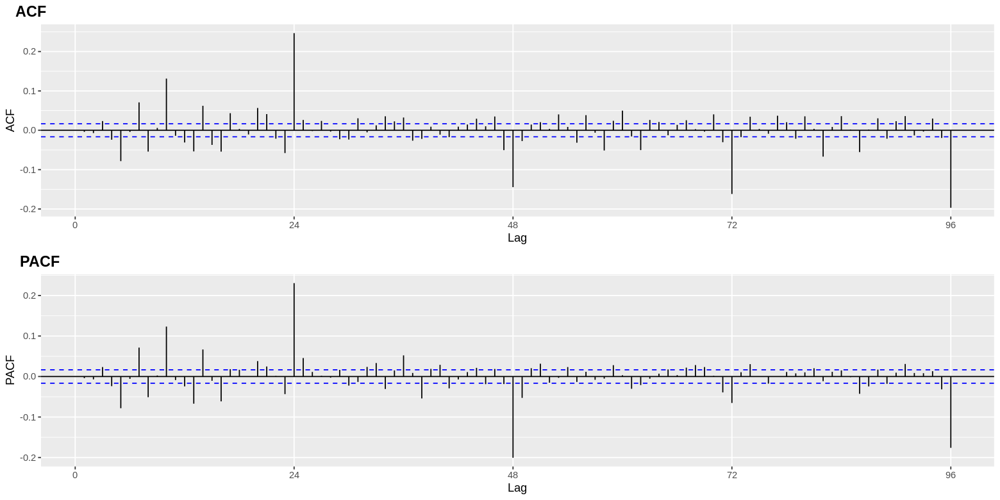

In [76]:
acf_arima3 <- ggAcf(mod3_arima$residuals,
                    lag.max = 96,
                    main = "")
pacf_arima3 <- ggPacf(mod3_arima$residuals,
                      lag.max = 96,
                      main = "")

ggarrange(acf_arima3,
          pacf_arima3,
          labels = c("ACF", "PACF"),
          nrow = 2, ncol = 1)


	Ljung-Box test

data:  Residuals from ARIMA(3,0,0)(0,1,1)[24] with drift
Q* = 2109.6, df = 43, p-value < 2.2e-16

Model df: 5.   Total lags used: 48



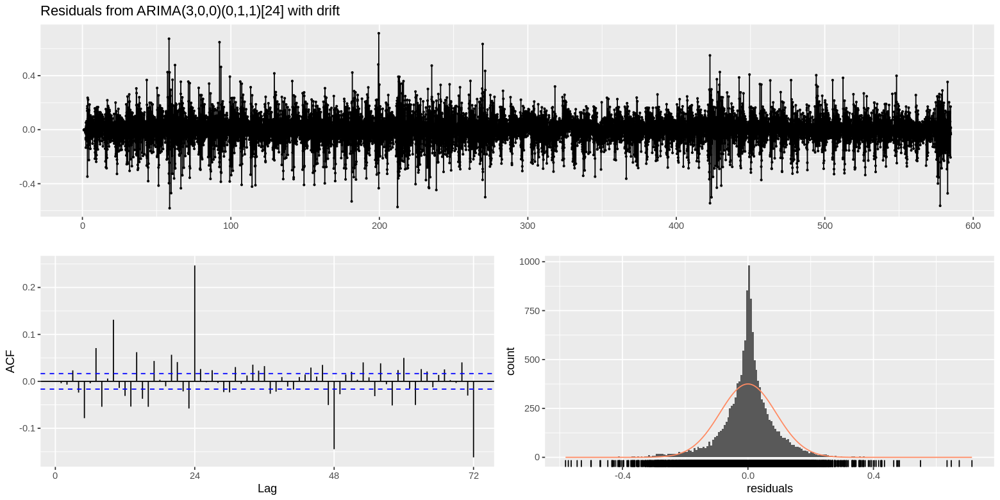

In [77]:
checkresiduals(mod3_arima)

##### Previsioni

In [78]:
pred_val3 <- forecast(mod3_arima,
                      h = 3504)   #-- Dimensione del Validation
pred_val3 <- ts(pred_val3$mean,
                start = 585,
                frequency = 24)

##### Grafico Previsioni

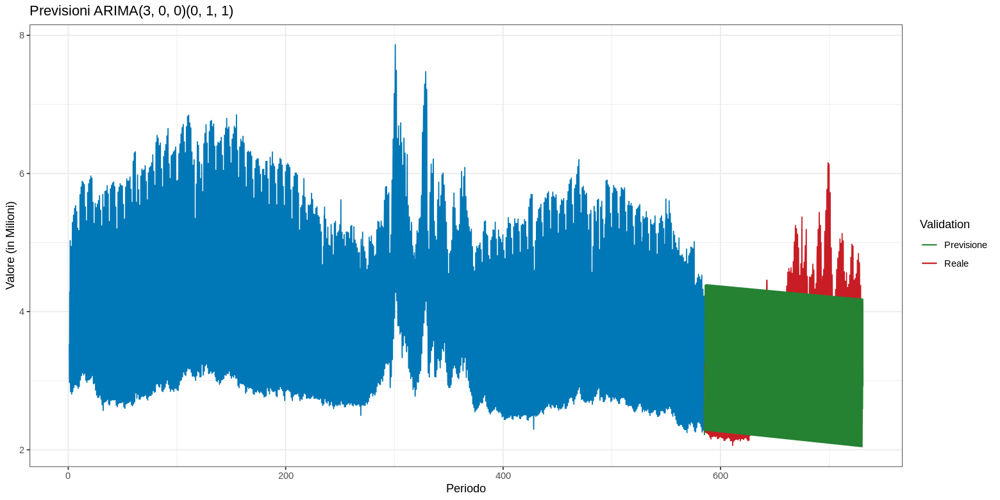

In [79]:
plot_val(pred_val3,
         "Previsioni ARIMA(3, 0, 0)(0, 1, 1)")

##### Mean Absolute Error

In [80]:
mae_mod3_arima <- mean(abs(pred_val3 - validation_arima))
mae_mod3_arima

[1] 0.5494723

#### 4. *ARIMA*$(3, 0, 0)(0, 1, 2)_{24h}$

In [81]:
mod4_arima <- Arima(train_arima,             #-- Data
                    c(3, 0, 0),              #-- ARIMA
                    c(0, 1, 2),              #-- ARIMA Stagionale
                    lambda = "auto",         #-- Coefficiente Lambda
                    include.constant = TRUE) #-- Includere Costante

smod4_arima <- summary(mod4_arima)
smod4_arima[, "MAE"]

Series: train_arima 
ARIMA(3,0,0)(0,1,2)[24] with drift 
Box Cox transformation: lambda= 0.9284836 

Coefficients:
         ar1      ar2     ar3     sma1     sma2   drift
      1.6031  -0.8672  0.2030  -0.4391  -0.3409  -1e-04
s.e.  0.0083   0.0142  0.0083   0.0080   0.0078   1e-04

sigma^2 estimated as 0.007093:  log likelihood=14756.56
AIC=-29499.11   AICc=-29499.1   BIC=-29446.29

Training set error measures:
                        ME       RMSE        MAE       MPE     MAPE     MASE
Training set -0.0002665178 0.07993936 0.05274556 0.8679947 39.36775 0.232656
                     ACF1
Training set -0.006259755


[1] 0.05274556

Warning message:
“Ignoring unknown parameters: main”
Warning message:
“Ignoring unknown parameters: main”


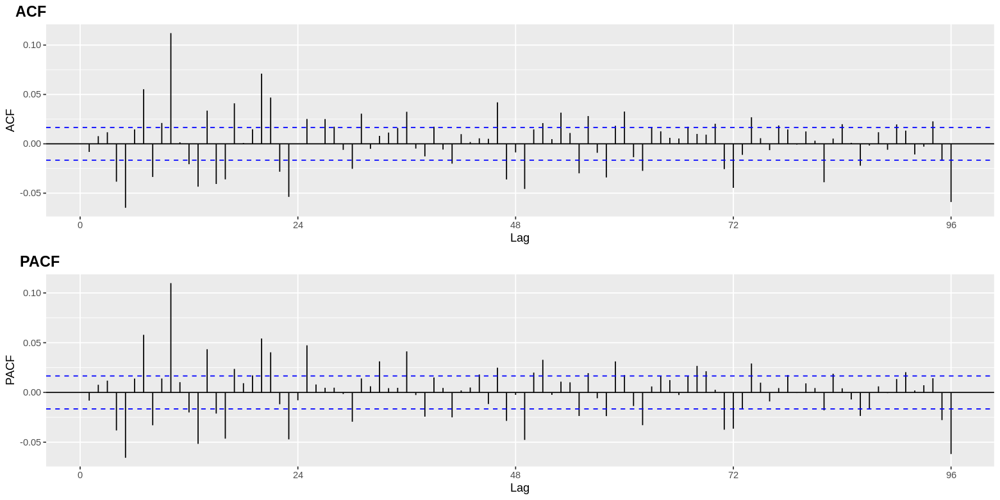

In [82]:
acf_arima4 <- ggAcf(mod4_arima$residuals,
                    lag.max = 96,
                    main = "")
pacf_arima4 <- ggPacf(mod4_arima$residuals,
                      lag.max = 96,
                      main = "")

ggarrange(acf_arima4,
          pacf_arima4,
          labels = c("ACF", "PACF"),
          nrow = 2, ncol = 1)


	Ljung-Box test

data:  Residuals from ARIMA(3,0,0)(0,1,2)[24] with drift
Q* = 722.37, df = 42, p-value < 2.2e-16

Model df: 6.   Total lags used: 48



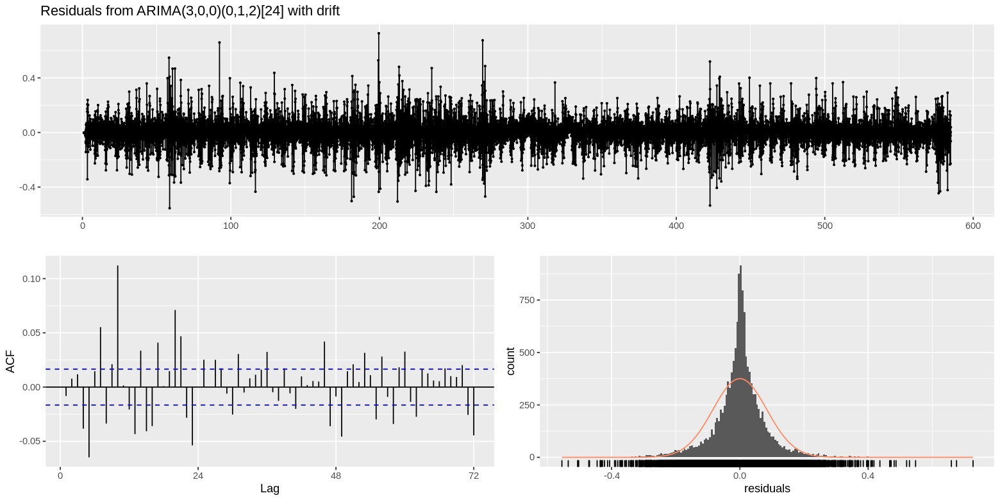

In [83]:
checkresiduals(mod4_arima)

##### Previsioni

In [84]:
pred_val4 <- forecast(mod4_arima,
                      h = 3504)   #-- Dimensione del Validation
pred_val4 <- ts(pred_val4$mean,
                start = 585,
                frequency = 24)

##### Grafico Previsioni

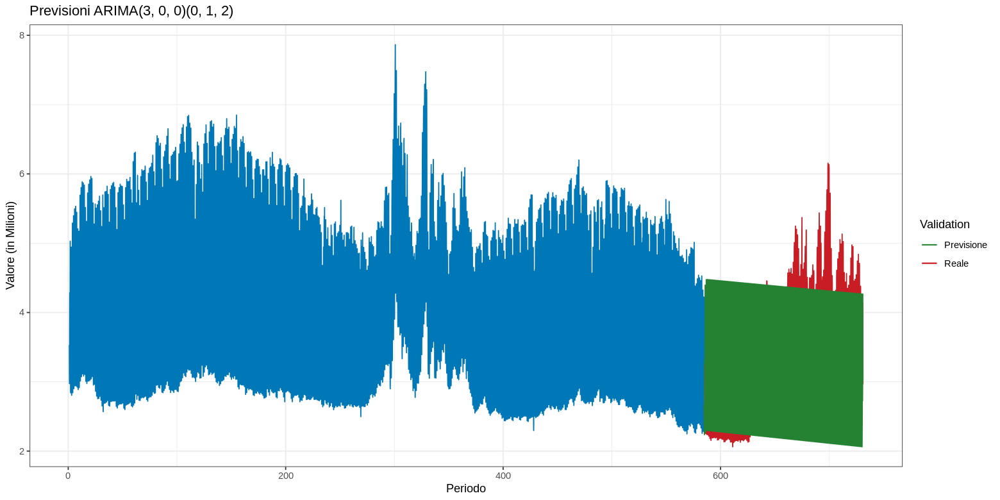

In [85]:
plot_val(pred_val4,
         "Previsioni ARIMA(3, 0, 0)(0, 1, 2)")

##### Mean Absolute Error

In [86]:
mae_mod4_arima <- mean(abs(pred_val4 - validation_arima))
mae_mod4_arima

[1] 0.5206016

#### 5. *ARIMA*$(3, 1, 2)(0, 0, 0)_{24h}$ con regressore di Fourier

In [87]:
y <- msts(train_arima,
          c(24, 365*24)) #-- Multistagionalità

mod5_arima <- Arima(train_arima,                 #-- Data
                    c(3, 1, 2),                  #-- ARIMA
                    c(0, 0, 0),                  #-- ARIMA Stagionale
                    lambda = "auto",             #-- Coefficiente Lambda
                    include.constant = TRUE,     #-- Includere Costante
                    xreg = fourier(y,
                                   K = c(2, 2))) #-- Regressore di Fourier

smod5_arima <- summary(mod5_arima)
smod5_arima[, "MAE"]

Series: train_arima 
Regression with ARIMA(3,1,2) errors 
Box Cox transformation: lambda= 0.9284836 

Coefficients:
         ar1      ar2      ar3      ma1      ma2  drift    S1-24    C1-24
      0.9826  -0.1403  -0.1211  -0.4124  -0.5188  0e+00  -0.9170  -0.3918
s.e.  0.0436   0.0622   0.0304   0.0417   0.0381  3e-04   0.0101   0.0101
        S2-24    C2-24  S1-8760  C1-8760  S2-8760  C2-8760
      -0.6848  -0.1313   0.2972  -0.0554  -0.3383  -0.0407
s.e.   0.0081   0.0081   0.6363   0.6816   0.3206   0.3261

sigma^2 estimated as 0.02354:  log likelihood=6390.26
AIC=-12750.51   AICc=-12750.48   BIC=-12637.3

Training set error measures:
                       ME      RMSE       MAE       MPE     MAPE      MASE
Training set 2.907439e-05 0.1473555 0.1173639 -16.04222 79.73114 0.5176816
                    ACF1
Training set 0.002064574


[1] 0.1173639

Warning message:
“Ignoring unknown parameters: main”
Warning message:
“Ignoring unknown parameters: main”


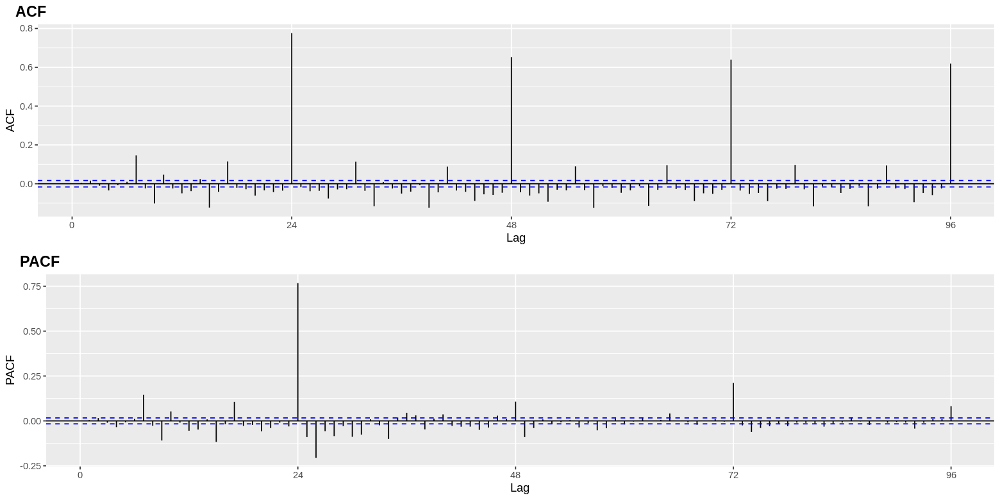

In [88]:
acf_arima5 <- ggAcf(mod5_arima$residuals,
                    lag.max = 96,
                    main = "")
pacf_arima5 <- ggPacf(mod5_arima$residuals,
                      lag.max = 96,
                      main = "")

ggarrange(acf_arima5,
          pacf_arima5,
          labels = c("ACF", "PACF"),
          nrow = 2, ncol = 1)


	Ljung-Box test

data:  Residuals from Regression with ARIMA(3,1,2) errors
Q* = 16796, df = 34, p-value < 2.2e-16

Model df: 14.   Total lags used: 48



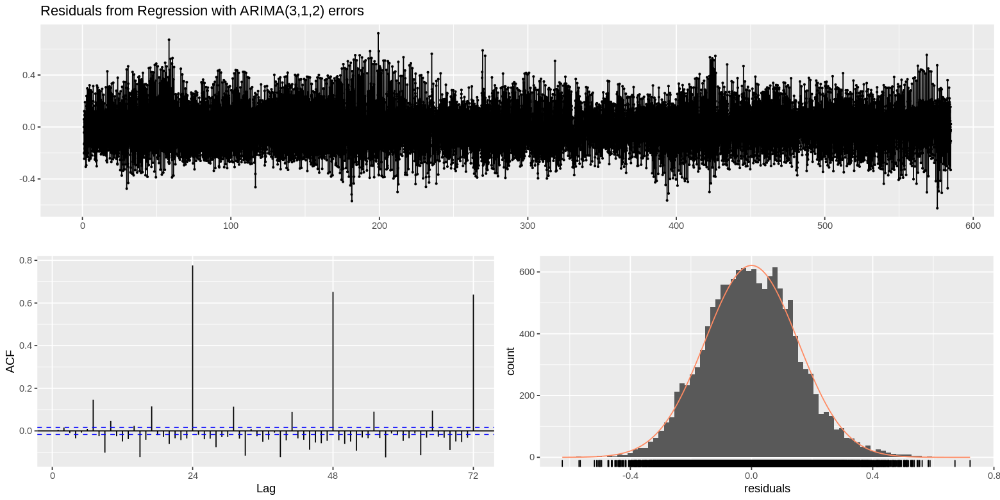

In [89]:
checkresiduals(mod5_arima)

##### Previsioni

In [90]:
pred_val5 <- forecast(mod5_arima,
                      h = 3504,                    #-- Dimensione del Validation
                      xreg = fourier(y,
                                     K = c(2, 2))) #-- Regressore di Fourier
pred_val5 <- ts(pred_val5$mean,
                start = 585,
                end = 731,
                frequency = 24)

##### Grafico Previsioni

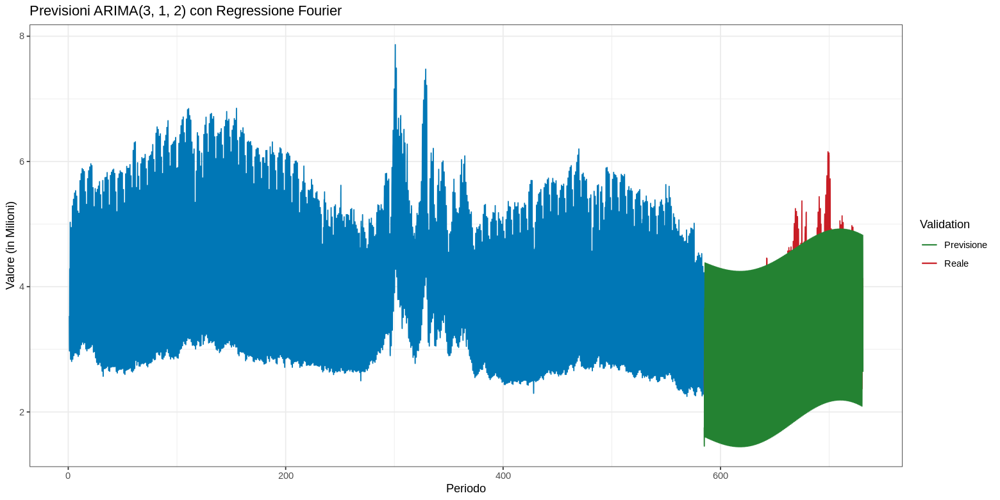

In [91]:
plot_val(pred_val5,
         "Previsioni ARIMA(3, 1, 2) con Regressione Fourier")

##### Mean Absolute Error

In [92]:
mae_mod5_arima <- mean(abs(pred_val5 - validation_arima))
mae_mod5_arima

[1] 0.477766

#### 6. *ARIMA*$(5, 0, 2)(2, 1, 0)_{24h}$

In [93]:
automod_arima <- auto.arima(train_arima,
                            lambda = "auto")

sautomod_arima <- summary(automod_arima)
sautomod_arima[, "MAE"]

Series: train_arima 
ARIMA(5,0,1)(2,1,0)[24] 
Box Cox transformation: lambda= 0.9284836 

Coefficients:
         ar1      ar2     ar3      ar4     ar5      ma1     sar1     sar2
      1.7911  -1.1801  0.3910  -0.1167  0.0677  -0.1813  -0.2681  -0.2979
s.e.  0.1204   0.1944  0.1059   0.0246  0.0101   0.1201   0.0082   0.0081

sigma^2 estimated as 0.008076:  log likelihood=13856.39
AIC=-27694.77   AICc=-27694.76   BIC=-27626.86

Training set error measures:
                        ME       RMSE        MAE       MPE     MAPE      MASE
Training set -0.0004845605 0.08489033 0.05501384 -1.195677 39.75589 0.2426612
                    ACF1
Training set 0.002138583


[1] 0.05501384

Warning message:
“Ignoring unknown parameters: main”
Warning message:
“Ignoring unknown parameters: main”


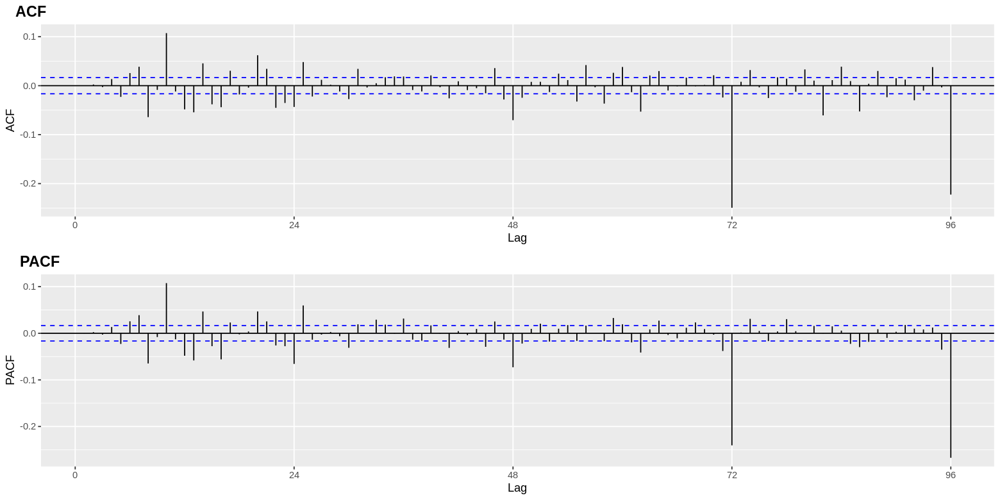

In [94]:
acf_automod <- ggAcf(automod_arima$residuals,
                     lag.max = 96,
                     main = "")
pacf_automod <- ggPacf(automod_arima$residuals,
                       lag.max = 96,
                       main = "")

ggarrange(acf_automod,
          pacf_automod,
          labels = c("ACF", "PACF"),
          nrow = 2, ncol = 1)


	Ljung-Box test

data:  Residuals from ARIMA(5,0,1)(2,1,0)[24]
Q* = 783.22, df = 40, p-value < 2.2e-16

Model df: 8.   Total lags used: 48



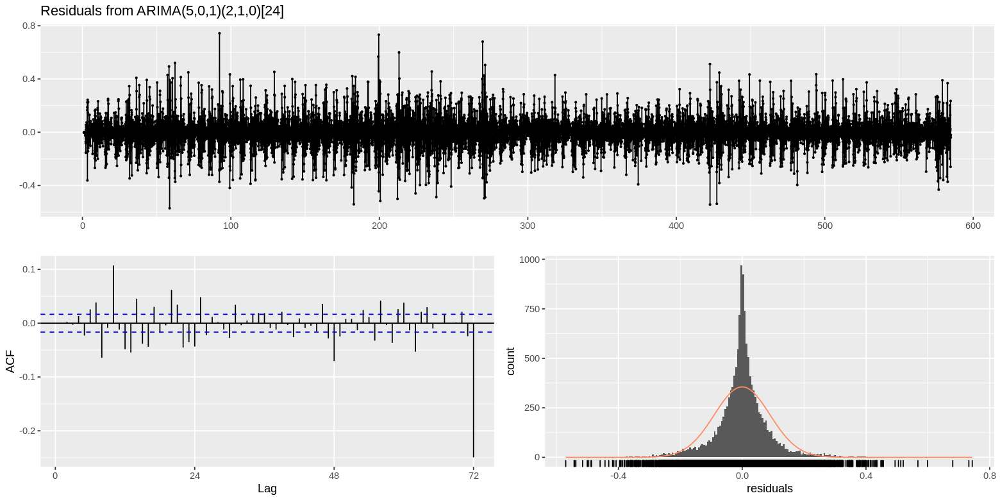

In [95]:
checkresiduals(automod_arima)

##### Previsioni

In [96]:
pred_val_auto <- forecast(automod_arima,
                          h = 3504)      #-- Dimensione del Validation
pred_val_auto <- ts(pred_val_auto$mean,
                    start = 585,
                    frequency = 24)

##### Grafico Previsioni

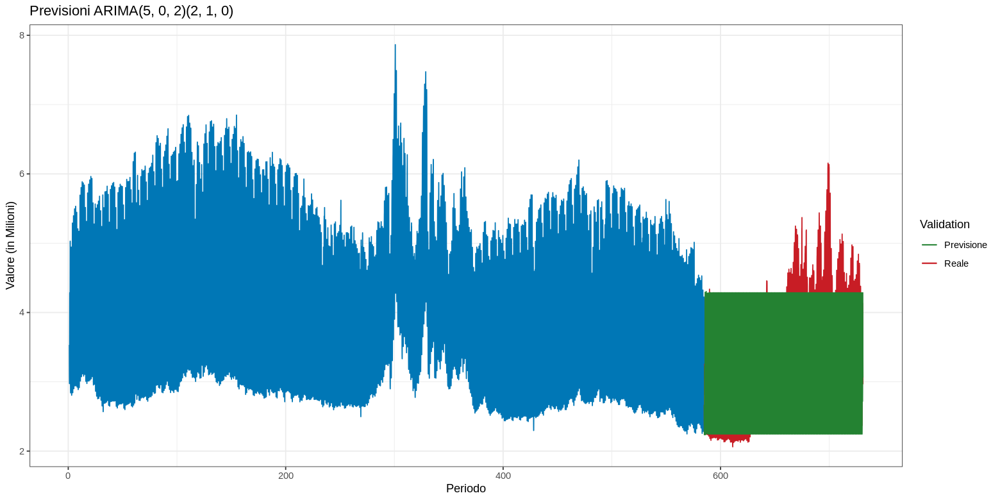

In [97]:
plot_val(pred_val_auto,
         "Previsioni ARIMA(5, 0, 2)(2, 1, 0)")

##### Mean Absolute Error

In [98]:
mae_automod_arima <- mean(abs(pred_val_auto - validation_arima))
mae_automod_arima

[1] 0.4963583

### Previsione su Test con Modello Migliore

In [99]:
mae_arima_val <- rbind(mae_mod1_arima,
                       mae_mod2_arima,
                       mae_mod3_arima,
                       mae_mod4_arima,
                       mae_mod5_arima)
mae_arima_train <- rbind(smod1_arima[,"MAE"],
                         smod2_arima[,"MAE"],
                         smod3_arima[,"MAE"],
                         smod4_arima[,"MAE"],
                         smod5_arima[,"MAE"])

mae_arima <- cbind(mae_arima_train,
                   mae_arima_val)

colnames(mae_arima) <- c("Train", "Validation")
rownames(mae_arima) <- c("ARIMA(2,0,0)(0,1,0)",
                         "ARIMA(2,0,0)(0,1,1)",
                         "ARIMA(3,0,0)(0,1,1)",
                         "ARIMA(3,0,0)(0,1,2)",
                         "ARIMAX(3,1,2) Fourier")
mae_arima

,Train,Validation
"ARIMA(2,0,0)(0,1,0)",0.05751714,0.5661811
"ARIMA(2,0,0)(0,1,1)",0.05832183,0.5436152
"ARIMA(3,0,0)(0,1,1)",0.05639041,0.5494723
"ARIMA(3,0,0)(0,1,2)",0.05274556,0.5206016
"ARIMAX(3,1,2) Fourier",0.11736388,0.4777660


#### Costruzione Modello

In [100]:
y_best <- msts(ts_stand,
               c(24, 365*24)) #-- Multistagionalità

best_arima <- Arima(y_best,
                    c(3, 1, 2),
                    lambda = "auto",
                    include.constant = TRUE,
                    xreg = fourier(y_best,
                                   K = c(2, 2)))
sbest_arima <- summary(best_arima)
sbest_arima[,"MAE"]

Series: y_best 
Regression with ARIMA(3,1,2) errors 
Box Cox transformation: lambda= 1 

Coefficients:
         ar1     ar2      ar3      ma1      ma2  drift    S1-24    C1-24
      0.8288  0.1430  -0.2796  -0.2660  -0.6522  0e+00  -0.8050  -0.3491
s.e.  0.0258  0.0375   0.0189   0.0235   0.0215  3e-04   0.0088   0.0088
        S2-24    C2-24  S1-8760  C1-8760  S2-8760  C2-8760
      -0.5848  -0.1648   0.2241   0.0185  -0.3908  -0.0316
s.e.   0.0073   0.0073   0.5644   0.5632   0.2823   0.2817

sigma^2 estimated as 0.02027:  log likelihood=9296.02
AIC=-18562.04   AICc=-18562.02   BIC=-18445.48

Training set error measures:
                        ME      RMSE       MAE       MPE     MAPE      MASE
Training set -7.890279e-05 0.1423169 0.1112389 -12.94224 86.39547 0.1540141
                   ACF1
Training set 0.01037114


[1] 0.1112389

##### Previsione

In [104]:
pred_best_arima <- forecast(best_arima,
                            h = 1464,
                            xreg = fourier(y_best,
                                           K = c(2, 2)))
pred_best_arima <- unscale(as.numeric(pred_best_arima$mean),
                           ts_stand)

##### Grafico

In [103]:
#-- Aggiunta Date Test Set
fore <- c()
for (j in c(1:61)){
  for (i in c(1:24)){
    
    date <- as_date("2020-08-31") + j
    hours <- hms::hms(hours = i)
    
    #print(ymd_hms(paste(date, " ", hours)))
    fore <- append(fore, ymd_hms(paste(date, " ", hours)))
  }
}

In [105]:
dyn_pred_best_arima <- xts::xts(x = pred_best_arima[1:(61*24)],
                                order.by = fore)

dyn_pred_val5 <- xts::xts(x = unscale(pred_val5[1:3504], ts_stand),
                          order.by = ymdhms[(nrow(ts) - 3503):nrow(ts)])

all_arima <- cbind(dyn_ts,
                   dyn_pred_val5,
                   dyn_pred_best_arima)/1000000
colnames(all_arima) <- c("Reali",
                         "Validation",
                         "Previsione")

In [106]:
dygraph(all_arima)                           %>%
  dySeries("Reali",
           label = "Reali")                  %>% #-- Train Dataset
  dySeries("Previsione",
           label = "Previsione")             %>% #-- Test Dataset
  dySeries("Validation",
           label = "Validation")             %>% #-- Validation Dataset
  dyOptions(drawPoints = TRUE,                   #-- Draw Points
            pointSize = 0.5,                     #-- Size of Points
            colors = c("blue",
                       "red",
                       "black"))             %>% #-- Colori
  dyAxis("y", label = "Valore (in Milioni)") %>% #-- Asse Y
  dyAxis("x", label = "Periodo",
         drawGrid = FALSE)                   %>% #-- Asse X
  dyRangeSelector(height = 20)               %>% #-- Slider 
  dyLegend(width = 350)                  

HTML widgets cannot be represented in plain text (need html)

## UCM

### Scomposizione Train e Validation

In [107]:
train_ucm <- ts(ts_stand[1:as.integer(nrow(ts_stand)*0.8), ],
                frequency = 24,
                start = 1)

validation_ucm <- ts(ts_stand[(1 + as.integer(nrow(ts_stand)*0.8)) : nrow(ts_stand), ],
                     frequency = 24,
                     start = 585)

v_train_ucm <- var(train_ucm) #-- Varianza per Modelli

### 1. Local Linear Trend

In [108]:
mod1_ucm <- SSModel(train_ucm ~ SSMtrend(2,                    #-- 2 Equazioni da Calcolare
                                         Q = list(matrix(NA),
                                                  matrix(0))), #-- Matrice Q con Dimensioni 2*2
                    H = matrix(NA))                            #-- matrice H

mod1_ucm$Q
mod1_ucm$T
mod1_ucm$Z

, , 1

     [,1] [,2]
[1,]   NA    0
[2,]    0    0

, , 1

      level slope
level     1     1
slope     0     1

, , 1

     level slope
[1,]     1     0

#### Adattamento del Modello

In [109]:
fit1_ucm <- fitSSM(mod1_ucm,
                   inits = log(c(v_train_ucm/10,    #-- Inizializzaione
                                 v_train_ucm/20,    #-- Inserire i valori
                                 v_train_ucm/100))) #-- della Varianza

fit1_ucm$optim.out$convergence                      #-- Convergenza
fit1_ucm$model$Q                                    #-- Varianze Stimate dal modello          

[1] 0

, , 1

          [,1] [,2]
[1,] 0.1231821    0
[2,] 0.0000000    0

#### Previsioni del Modello (Validation)

In [110]:
pred1_ucm <- predict(fit1_ucm$model,
                     n.ahead = length(validation_ucm))  #-- Numerosità Validation (3504)
pred1_ucm <- ts(pred1_ucm,                              #-- Dataset Previsione
                start = 585,                            #-- 585 Giorni
                frequency = 24)                         #-- Frequenza Giornaliera

#### Grafico Previsioni

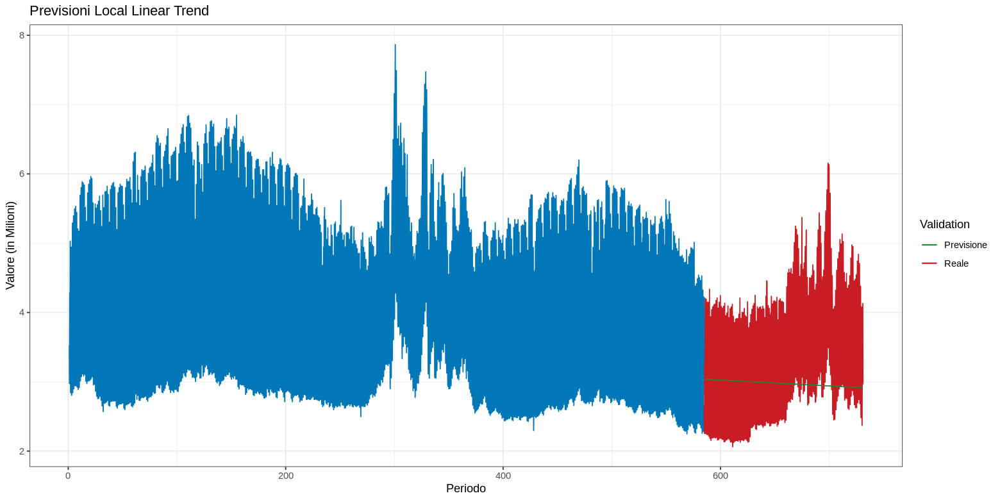

In [111]:
plot_val(pred1_ucm,
         "Previsioni Local Linear Trend")

#### Mean Absolute Error

In [112]:
mae1_ucm <- mean(abs(validation_ucm - pred1_ucm))
mae1_ucm

[1] 0.6857947

### 2. Local Linear Trend con Stagionalità Dummy

In [113]:
mod2_ucm <- SSModel(train_ucm ~ SSMtrend(2,                     #-- 2 Equazioni da Calcolare
                                         Q = list(matrix(NA),
                                                  matrix(0))) + #-- Matrice Q con Dimensioni 2*2
                      SSMseasonal(24,                           #-- Periodo Stagionalità
                                  Q = matrix(NA),
                                  sea.type = 'dummy'),          #-- Dummy
                    H = matrix(NA))                             #-- Matrice H

#### Adattamento del Modello

In [114]:
fit2_ucm<- fitSSM(mod2_ucm, inits = log(c(v_train_ucm/10,
                                          v_train_ucm/100,      #-- Inizializzaione
                                          v_train_ucm/2,        #-- Inserire i valori
                                          v_train_ucm/50)))     #-- della Varianza

fit2_ucm$optim.out$convergence                                  #-- Convergenza
fit2_ucm$model$Q                                                #-- Varianze Stimate dal modello

[1] 0

, , 1

           [,1] [,2]         [,3]
[1,] 0.01178772    0 0.0000000000
[2,] 0.00000000    0 0.0000000000
[3,] 0.00000000    0 0.0001397364

#### Previsioni del Modello (Validation)

In [115]:
pred2_ucm <- predict(fit2_ucm$model,
                     n.ahead = length(validation_ucm)) #-- Numerosità Validation (3504)
pred2_ucm <- ts(pred2_ucm,                             #-- Dataset Previsione
                start = 585,                           #-- 585 Giorni
                frequency = 24)                        #-- Frequenza Giornaliera

#### Grafico Previsioni

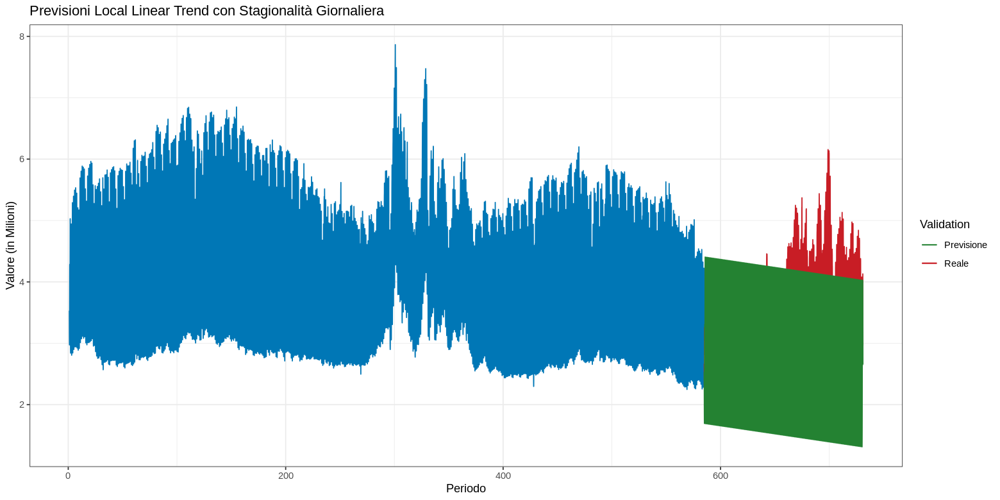

In [116]:
plot_val(pred2_ucm,
         "Previsioni Local Linear Trend con Stagionalità Giornaliera")

#### Mean Absolute Error

In [117]:
mae2_ucm <- mean(abs(validation_ucm - pred2_ucm))
mae2_ucm

[1] 0.7414186

### 3. Local Linear Trend con Stagionalità Trigonometrica

In [118]:
mod3_ucm <- SSModel(train_ucm ~ SSMtrend(2,                     #-- 2 Equazioni da Calcolare
                                         Q = list(matrix(NA),   
                                                  matrix(0))) + #-- Matrice Q con Dimensioni 2*2
                      SSMseasonal(24,                           #-- Periodo Stagionalità
                                  Q = matrix(NA),            
                                  sea.type = "trigonometric"),  #-- Trigonometrica
                    H = matrix(NA))                             #-- Matrice H

#### Adattamento del Modello

Funzione di Update: da 1 a 4 le varianze non sono costanti, da 5 a 25 le varianzi sono costanti

In [119]:
updt3 <- function(pars, model){
  model$Q[1, 1, 1] <- exp(pars[1])
  model$Q[2, 2, 1] <- exp(pars[2])
  model$Q[3, 3, 1] <- exp(pars[3])
  model$Q[4, 4, 1] <- exp(pars[4])
  diag(model$Q[5 : 25, 5 : 25, 1]) <- exp(pars[5])
  model$H[1, 1, 1] <- exp(pars[6])
  model
}

In [120]:
fit3_ucm <- fitSSM(mod3_ucm,
                   log(c(v_train_ucm/10,
                         v_train_ucm/100,
                         v_train_ucm/75,
                         v_train_ucm/20,         #-- Inizializzaione
                         v_train_ucm/50,         #-- Inserire i valori
                         v_train_ucm/5)),        #-- della Varianza
                   updt3,                        #-- Funzione di Update
                   control = list(maxit = 1000)) #-- Numero Masimo di Iterazioni

fit3_ucm$optim.out$convergence                   #-- Convergenza
fit3_ucm$optim.out$counts                        #-- Varianze Stimate dal modello


[1] 0

function gradient 
     779       NA

#### Previsioni del Modello (Validation)

In [121]:
pred3_ucm <- predict(fit3_ucm$model,
                     n.ahead = length(validation_ucm)) #-- Numerosità Validation (3504)
pred3_ucm <- ts(pred3_ucm,                             #-- Dataset Previsione
                start = 585,                           #-- 585 Giorni
                frequency = 24)                        #-- Frequenza Giornaliera

#### Grafico Previsioni

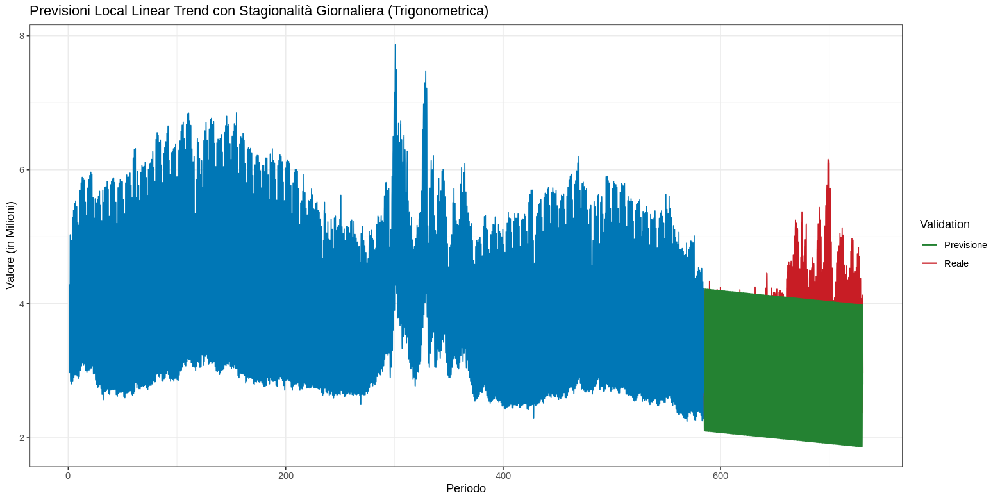

In [122]:
plot_val(pred3_ucm,
         "Previsioni Local Linear Trend con Stagionalità Giornaliera (Trigonometrica)")

#### Mean Absolute Error

In [123]:
mae3_ucm <- mean(abs(validation_ucm - pred3_ucm))
mae3_ucm

[1] 0.5612485

### 4. Local Linear Trend con Stagionalità Dummy e Ciclo Annuale

In [124]:
mod4_ucm <- SSModel(train_ucm ~ SSMtrend(2,                     #-- 2 Equazioni da Calcolare
                                         Q = list(matrix(NA),
                                                  matrix(0))) + #-- Matrice Q con Dimensioni 2*2
                      SSMseasonal(24,                           #-- Periodo Stagionalità
                                  Q = matrix(NA),
                                  sea.type = 'dummy')         + #-- Dummy
                      SSMcycle(24*365),                         #-- Ciclo Annuale
                    H = matrix(NA))                             #-- Matrice H

#### Adattamento del Modello

In [125]:
fit4_ucm <- fitSSM(mod4_ucm,
                  inits = log(c(v_train_ucm/10,
                                v_train_ucm/100,  #-- Inizializzaione
                                v_train_ucm/2,    #-- Inserire i valori
                                v_train_ucm/50))) #-- della Varianza

fit4_ucm$optim.out$convergence                    #-- Convergenza
fit4_ucm$model$Q                                  #-- Varianze Stimate dal modello

[1] 0

, , 1

          [,1] [,2]         [,3]
[1,] 0.0117921    0 0.0000000000
[2,] 0.0000000    0 0.0000000000
[3,] 0.0000000    0 0.0001397413

#### Previsioni del Modello (Validation)

In [126]:
pred4_ucm <- predict(fit4_ucm$model,
                     n.ahead = length(validation_ucm)) #-- Numerosità Validation (3504)
pred4_ucm <- ts(pred4_ucm,                             #-- Dataset Previsione
                start = 585,                           #-- 585 Giorni
                frequency = 24)                        #-- Frequenza Giornaliera

#### Grafico Previsioni

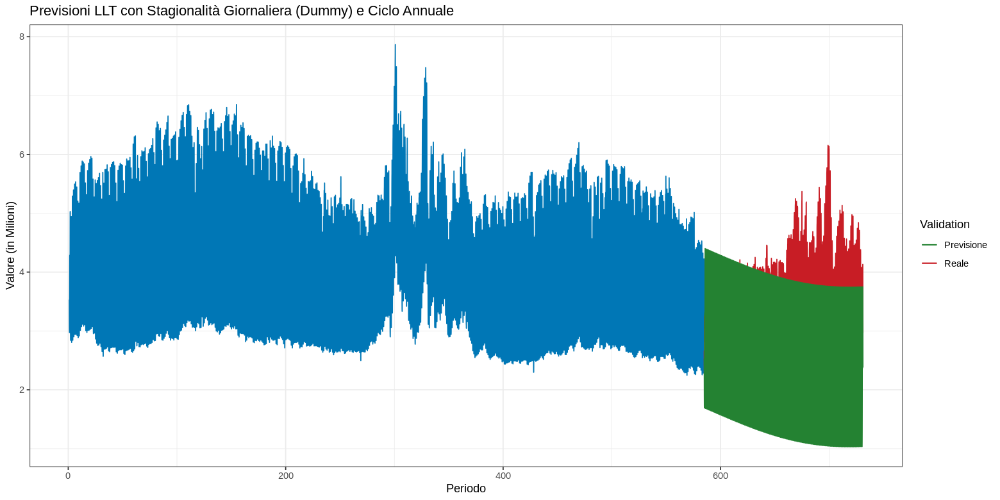

In [127]:
plot_val(pred4_ucm,
         "Previsioni LLT con Stagionalità Giornaliera (Dummy) e Ciclo Annuale")

#### Mean Absolute Error

In [128]:
mae4_ucm <- mean(abs(validation_ucm - pred4_ucm))
mae4_ucm

[1] 0.9587156

### 5. Random Walk con Stagionalità Dummy e Ciclo Annuale

In [129]:
mod5_ucm <- SSModel(train_ucm ~ SSMtrend(1,             #-- 1 Equazione da Calcolare
                                         NA)          +
                      SSMseasonal(24,                   #-- Periodo Stagionalità
                                  NA,
                                  sea.type = "dummy") + #-- Dummy
                      SSMcycle(24*365),                 #-- #-- Ciclo Annuale
                    H = matrix(NA))                     #-- Matrice H

#### Adattamento del Modello

In [130]:
fit5_ucm <- fitSSM(mod5_ucm,
                  inits = log(c(v_train_ucm/10,
                                v_train_ucm/100,  #-- Inizializzaione
                                v_train_ucm/2,    #-- Inserire i valori
                                v_train_ucm/50))) #-- della Varianza
                                
fit5_ucm$optim.out$convergence                    #-- Convergenza
fit5_ucm$model$Q                                  #-- Varianze Stimate dal modello

[1] 0

, , 1

           [,1]         [,2]
[1,] 0.01179118 0.0000000000
[2,] 0.00000000 0.0001397148

#### Previsioni del Modello (Validation)

In [131]:
pred5_ucm <- predict(fit5_ucm$model,
                     n.ahead = length(validation_ucm)) #-- Numerosità Validation (3504)
pred5_ucm <- ts(pred5_ucm,                             #-- Dataset Previsione
                start = 585,                           #-- 585 Giorni
                frequency = 24)                        #-- Frequenza Giornaliera

#### Grafico Previsioni

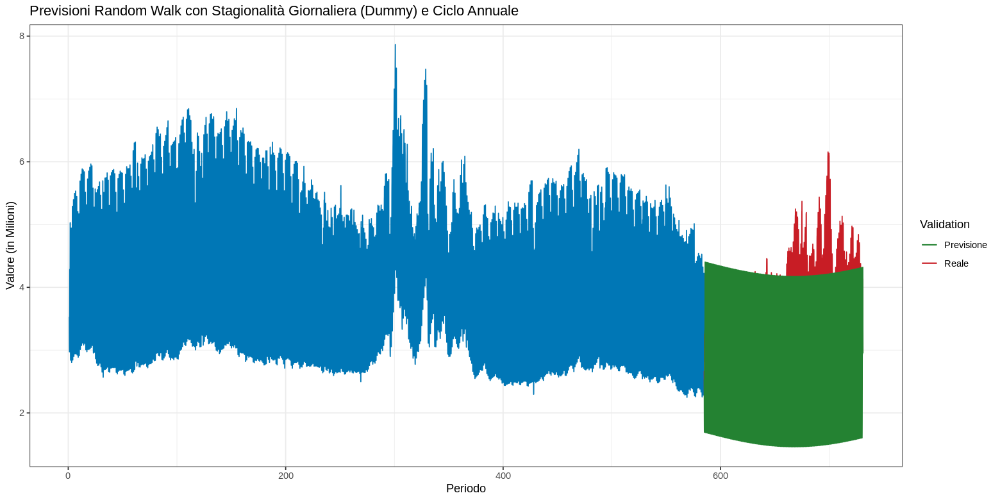

In [132]:
plot_val(pred5_ucm,
         "Previsioni Random Walk con Stagionalità Giornaliera (Dummy) e Ciclo Annuale")

#### Mean Absolute Error

In [133]:
mae5_ucm <- mean(abs(validation_ucm - pred5_ucm))
mae5_ucm

[1] 0.7028024

### Previsione Test Modello Migliore (UCM)

In [134]:
mae_ucm_train <- rbind(mean(abs(unscale(fitted(fit1_ucm$model), ts_stand) - unscale(train_ucm, ts_stand))),
                       mean(abs(unscale(fitted(fit2_ucm$model), ts_stand) - unscale(train_ucm, ts_stand))),
                       mean(abs(unscale(fitted(fit3_ucm$model), ts_stand) - unscale(train_ucm, ts_stand))),
                       mean(abs(unscale(fitted(fit4_ucm$model), ts_stand) - unscale(train_ucm, ts_stand))),
                       mean(abs(unscale(fitted(fit5_ucm$model), ts_stand) - unscale(train_ucm, ts_stand))))
mae_ucm_val <- rbind(mae1_ucm,
                     mae2_ucm,
                     mae3_ucm,
                     mae4_ucm,
                     mae5_ucm)

mae_ucm <- cbind(mae_ucm_train,
                 mae_ucm_val)

colnames(mae_ucm) <- c("Train", "Validation")
rownames(mae_ucm) <- c("LLT",
                       "LLT + Sd",
                       "LLT + St",
                       "LLT + Sd + Ca",
                       "RW + Sd + Ca")
mae_ucm

,Train,Validation
LLT,1.649556e-02,0.6857947
LLT + Sd,2.343932e-03,0.7414186
LLT + St,2.624038e-10,0.5612485
LLT + Sd + Ca,5.420106e-03,0.9587156
RW + Sd + Ca,5.043993e-03,0.7028024


In [135]:
pred_best_ucm <- SSModel(ts_stand ~ SSMtrend(1,         #-- 1 Equazione da Calcolare
                                             NA)      +
                      SSMseasonal(24,                   #-- Periodo Stagionalità
                                  NA,
                                  sea.type = "dummy") + #-- Dummy
                      SSMcycle(24*365),                 #-- Ciclo Annuale
                    H = matrix(NA))                     #-- Matrice H

#### Adattamento del Modello

In [136]:
fit_best_ucm <- fitSSM(pred_best_ucm,
                       inits = log(c(v_train_ucm/10,
                                     v_train_ucm/100,  #-- Inizializzaione
                                     v_train_ucm/2,    #-- Inserire i valori
                                     v_train_ucm/50))) #-- della Varianza

fit_best_ucm$optim.out$convergence                     #-- Convergenza
fit_best_ucm$model$Q                                   #-- Varianze Stimate dal modello


[1] 0

, , 1

           [,1]         [,2]
[1,] 0.01095311 0.0000000000
[2,] 0.00000000 0.0001412767

#### Previsioni del Modello (Validation)

In [137]:
pred_best_ucm <- predict(fit_best_ucm$model,
                         n.ahead = 1464)            #-- Numerosità Test
pred_best_ucm <- unscale(as.numeric(pred_best_ucm), #-- Valori non Scalati
                           ts_stand)

#### Grafico

In [138]:
dyn_pred_best_ucm <- xts::xts(x = pred_best_ucm,
                              order.by = fore)

dyn_pred_val5 <- xts::xts(x = unscale(pred5_ucm, ts_stand),
                          order.by = ymdhms[(nrow(ts) - 3503):nrow(ts)])

all_ucm <- cbind(dyn_ts,
                 dyn_pred_val5,
                 dyn_pred_best_ucm)/1000000
colnames(all_ucm) <- c("Reali",
                       "Validation",
                       "Previsione")

In [139]:
dygraph(all_ucm)                             %>%
  dySeries("Reali",
           label = "Reali")                  %>% #-- Train Dataset
  dySeries("Previsione",
           label = "Previsione")             %>% #-- Test Dataset
  dySeries("Validation",
           label = "Validation")             %>% #-- Validation Dataset
  dyOptions(drawPoints = TRUE,                   #-- Draw Points
            pointSize = 0.5,                     #-- Size of Points
            colors = c("blue",
                       "red",
                       "black"))             %>% #-- Colori
  dyAxis("y", label = "Valore (in Milioni)") %>% #-- Asse Y
  dyAxis("x", label = "Periodo",
         drawGrid = FALSE)                   %>% #-- Asse X
  dyRangeSelector(height = 20)               %>% #-- Slider 
  dyLegend(width = 350)                  

HTML widgets cannot be represented in plain text (need html)

## Machine Learning

#### KNN

In [140]:
train_knn <- ts_stand[1:as.integer(nrow(ts)*0.8)]
validation_knn <- ts_stand[(1 + as.integer(nrow(ts)*0.8)) : nrow(ts)]

#### 1. K-NN (1 Settimana Lookback)

##### Parametri

In [141]:
p_week <- 1:(24*7)      #-- Lunghezza del Frammento di Serie Storica di cui Individuare i k Vicini 
k      <- seq(1, 15, 2) #-- Numero di Vicini da Individuare
h      <- 3504          #-- Previsione (Numero Validation)

In [142]:
for (el in k){
  mod_knn_week <- knn_forecasting(timeS = train_knn,  #-- Serie Storica
                                  h    = h,           #-- Orizzonte
                                  lags = p_week,      #-- Autoregressione
                                  k    = el,          #-- Numero di k-NN
                                  msas = "recursive", #-- Recursive
                                  cf   = "mean")      #-- Combinazione Futuri
  
  #-- Previsione
  print(el)
  pred_knn <- ts(mod_knn_week$prediction, #-- Dataset Previsione
                 start = 585,             #-- 585 Giorni
                 frequency = 24)          #-- Frequenza Giornaliera
  
  #-- MAE
  mae_knn <- mean(abs(validation_knn - pred_knn))
  print(mae_knn)
}

[1] 1
[1] 0.4910516
[1] 3
[1] 0.4615173
[1] 5
[1] 0.4619938
[1] 7
[1] 0.4547679
[1] 9
[1] 0.4346361
[1] 11
[1] 0.4397841
[1] 13
[1] 0.4579108
[1] 15
[1] 0.4377829


##### Modello Migliore (k = 9)

In [143]:
mod_knn_week <- knn_forecasting(timeS = train_knn,  #-- Serie Storica
                                h    = h,           #-- Orizzonte
                                lags = p_week,      #-- Autoregressione
                                k    = 9,           #-- Numero di k-NN
                                msas = "recursive", #-- Recursive
                                cf   = "mean")      #-- Combinazione Futuri

pred_knn <- ts(mod_knn_week$prediction, #-- Dataset Previsione
               start = 585,             #-- 585 Giorni
               frequency = 24)          #-- Frequenza Giornaliera

##### Mean Absolute Error

In [145]:
mae_knn_week <- mean(abs(validation_knn - pred_knn))
mae_knn_week

mae_knn_week_train <- predict(mod_knn_week$model$ts)
mae_knn_week_train <- mean(abs(mae_knn_week_train$fitted - train_knn))
mae_knn_week_train

[1] 0.4346361

[1] 0.2629522

##### Grafico Previsioni

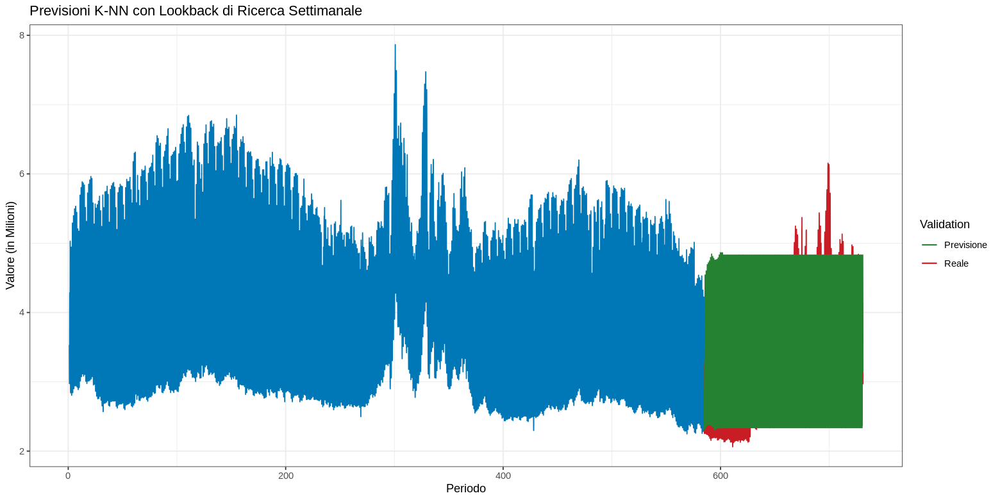

In [146]:
plot_val(pred_knn,
         "Previsioni K-NN con Lookback di Ricerca Settimanale")

### 2. K-NN (1 Giorno Lookback)

#### Parametri

In [147]:
p_day <- 1:24
k     <- seq(1, 30, 2)

In [148]:
for (el in k){
  mod_knn_day <- knn_forecasting(timeS = train_knn,   #-- Serie Storica
                                 h     = h,           #-- Orizzonte
                                 lags  = p_day,       #-- Autoregressione
                                 k     = el,          #-- Numero di k-NN
                                 msas  = "recursive", #-- Recursive
                                 cf    = "mean")      #-- Combinazione Futuri
  
  #-- Previsione
  print(el)
  pred_knn <- ts(mod_knn_day$prediction, #-- Dataset Previsione
                 start = 585,            #-- 585 Giorni
                 frequency = 24)         #-- Frequenza Giornaliera
  
  #-- MAE
  mae_knn <- mean(abs(validation_knn - pred_knn))
  print(mae_knn)
}

[1] 1
[1] 0.5125737
[1] 3
[1] 0.484935
[1] 5
[1] 0.4419961
[1] 7
[1] 0.4375276
[1] 9
[1] 0.4331438
[1] 11
[1] 0.4331153
[1] 13
[1] 0.4248837
[1] 15
[1] 0.4227488
[1] 17
[1] 0.4235103
[1] 19
[1] 0.4941237
[1] 21
[1] 0.5038973
[1] 23
[1] 0.5279412
[1] 25
[1] 0.5236612
[1] 27
[1] 0.5334989
[1] 29
[1] 0.4690687


#### Modello Migliore (k = 15)

In [149]:
mod_knn_day <- knn_forecasting(timeS = train_knn,  #-- Serie Storica
                               h    = h,           #-- Orizzonte
                               lags = p_week,      #-- Autoregressione
                               k    = 15,          #-- Numero di k-NN
                               msas = "recursive", #-- Recursive
                               cf   = "mean")      #-- Combinazione Futuri

pred_knn_day <- ts(mod_knn_week$prediction, #-- Dataset Previsione
                   start = 585,             #-- 585 Giorni
                   frequency = 24)          #-- Frequenza Giornaliera

##### Mean Absolute Error

In [150]:
mae_knn_day <- mean(abs(validation_knn - pred_knn_day))
mae_knn_day

mae_knn_day_train <- predict(mod_knn_day$model$ts)
mae_knn_day_train <- mean(abs(mae_knn_day_train$fitted - train_knn))
mae_knn_day_train

[1] 0.4346361

[1] 0.2629522

##### Grafico Previsioni

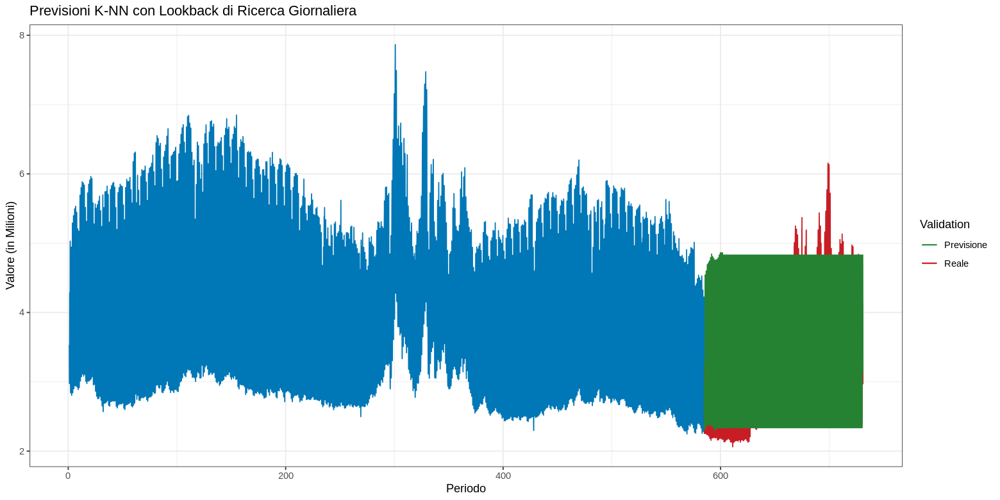

In [151]:
plot_val(pred_knn_day,
         "Previsioni K-NN con Lookback di Ricerca Giornaliera")

### RNN

#### Parametri

In [152]:
datalags   <- 24*7 #-- Orizzonte di ricerca
batch.size <- 73
epochs     <- 10

#### Scomposizione Train e Validation

In [154]:
train_lstm <- as.data.frame(ts_stand[seq(16352 + datalags)])
validation_lstm <- as.data.frame(ts_stand[16352 + datalags + seq(1168 + datalags)])

df_val <- ts_stand[(17520-1167) : 17520] #-- estrarre per mae
df_train <- ts_stand[1:(17520-1168)]

colnames(train_lstm) <- c("Valore")
colnames(validation_lstm) <- c("Valore")

In [ ]:
x.train <- array(data = lag(train_lstm$Valore, datalags)[ -(1 : datalags)],
                 dim = c(nrow(train_lstm) - datalags, datalags, 1))

y.train <- array(data = train_lstm$Valore[-(1:datalags)],
                 dim = c(nrow(train_lstm)-datalags, 1))

x.test <- array(data = lag(validation_lstm$Valore,
                           datalags)[ -(1 : datalags)],
                dim = c(nrow(validation_lstm) - datalags, datalags, 1))

y.test <- array(data = validation_lstm$Valore[ -(1 : datalags)],
                dim = c(nrow(validation_lstm) - datalags, 1))

### 3. LSTM (1 Layer)

#### Costruzione Modello

In [ ]:
model_lstm1 <- keras_model_sequential() #-- Costruzione Strato per Strato
model_lstm1 %>%
  layer_lstm(units            = 16,             #-- Numero Neuroni 
             input_shape      = c(datalags, 1), #-- Dimensione Input
             batch_size       = batch.size,
             return_sequences = TRUE,
             stateful         = TRUE) %>%
  layer_dense(units = 1)                        #-- Layer Denso (Previsione)

#### Compilazione

In [165]:
model_lstm1 %>%
  compile(loss = 'mae',                    #-- Funzione di Perdita
          optimizer = optimizer_rmsprop()) #-- Ottimizzatore

print(model_lstm1)

<pointer: 0x0>


#### Addestramento

In [ ]:
history_lstm1 <- model_lstm1 %>%
  fit(x          = x.train,      #-- Train
      y          = y.train,      #-- Test
      epochs     = epochs,       #-- Epoche di Addestramento
      batch_size = batch.size,   #-- Batch Size
      verbose    = 0,
      shuffle    = FALSE)

#### Funzione di Perdita

`geom_smooth()` using formula 'y ~ x'



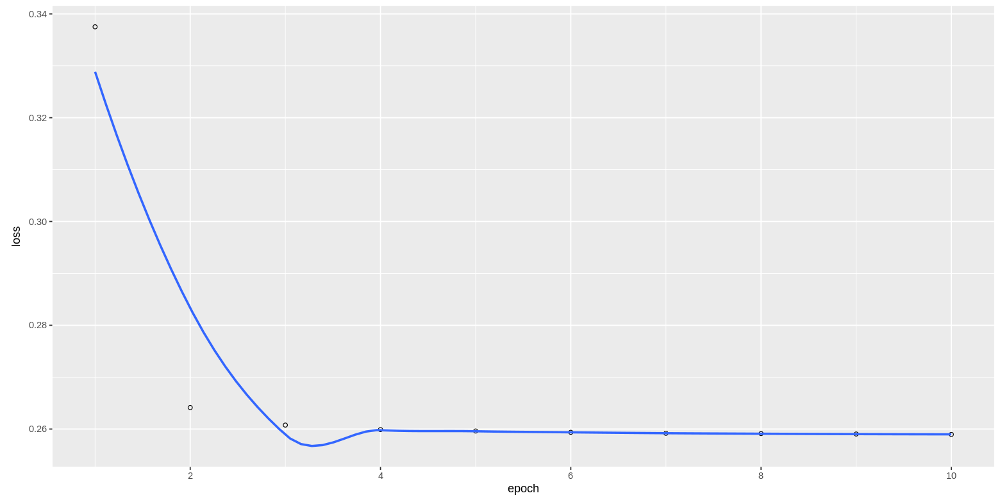

In [166]:
plot(history_lstm1)

#### Previsione

In [169]:
pred_out_lstm1 <- model_lstm1 %>%
  predict(x.test,
          batch_size = batch.size)

head(pred_out_lstm1[, 168, 1])

[1] 0.1684333 0.2780809 0.2419313 0.2597993 0.1234463 0.1236148

#### Grafico Previsione

Warning message:
“Removed 168 row(s) containing missing values (geom_path).”


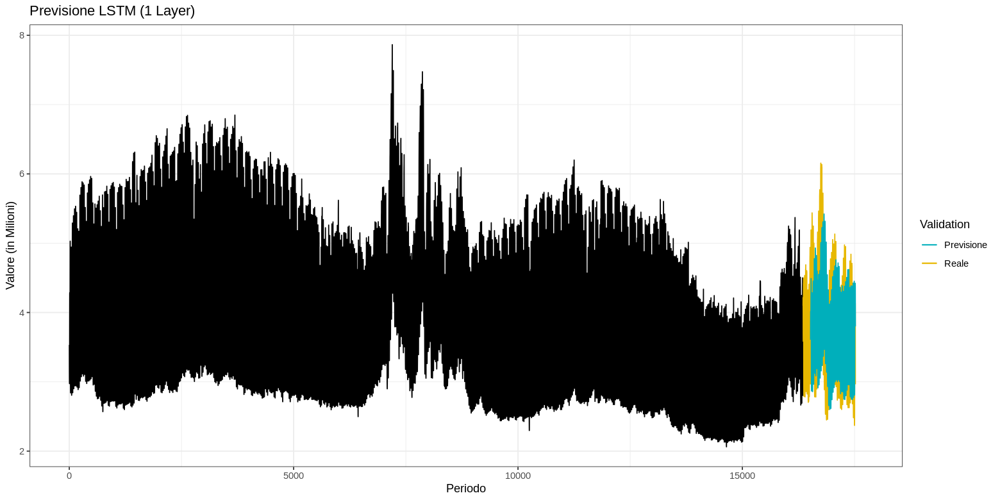

In [170]:
autoplot(ts(df_train, start = 1),
         main = "Previsione LSTM (1 Layer)",    #-- Titolo
         xlab = "Periodo",                      #-- Label X
         ylab = "Valore (in Milioni)")        + #-- Label Y
  autolayer(ts(df_val, start = 16352),                   
            series = "Reale")                 + #-- Validation
  autolayer(ts(pred_out_lstm1[,1,1],
               start = (16352 + datalags)),
            series = "Previsione")            + #-- Previsione
  scale_y_continuous(breaks = c(-2, 0, 2, 4),   
                     labels = c(2, 4, 6, 8))  + #-- Interruzioni
  scale_color_manual(values = c("#00AFBB",
                                "#E7B800",
                                "#FC4E07"))   + #-- Colori
  labs(color = "Validation")                  + #-- Legenda
  theme_bw()                                    #-- Tema

#### Mean Absolute Error

In [171]:
mae_lstm1 <- colMeans(drop_na(as.data.frame(abs(df_val - pred_out_lstm1[, 1, 1]))))
names(mae_lstm1) <- c("LSTM_1")
mae_lstm1

LSTM_1 
0.4628556

### 4. LSTM (2 Layer)

#### Costruzione Modello

In [ ]:
model_lstm2 <- keras_model_sequential()
model_lstm2 %>%
  layer_lstm(units            = 16,             #-- Numero Neuroni 
             input_shape      = c(datalags, 1), #-- Dimensione Input
             batch_size       = batch.size,
             return_sequences = TRUE,
             stateful         = TRUE) %>%       #-- Layer di tipo LSTM
  layer_dropout(rate = 0.5) %>%                 #-- Layer di Dropout
  layer_lstm(units            = 8,
             return_sequences = FALSE,
             stateful         = TRUE) %>%       #-- Layer di tipo LSTM
  layer_dropout(rate = 0.5) %>%                 #-- Layer di Dropout
  layer_dense(units = 1)                        #-- Layer Denso (Previsione)

#### Compilazione

In [161]:
model_lstm2 %>%
  compile(loss = 'mae',       #-- Funzione di Perdita
          optimizer = 'adam') #-- Ottimizzatore

print(model_lstm2)

Model
Model: "sequential_4"
________________________________________________________________________________
Layer (type)                        Output Shape                    Param #     
lstm_6 (LSTM)                       (73, 168, 16)                   1152        
________________________________________________________________________________
dropout_3 (Dropout)                 (73, 168, 16)                   0           
________________________________________________________________________________
lstm_5 (LSTM)                       (73, 8)                         800         
________________________________________________________________________________
dropout_2 (Dropout)                 (73, 8)                         0           
________________________________________________________________________________
dense_4 (Dense)                     (73, 1)                         9           
Total params: 1,961
Trainable params: 1,961
Non-trainable params: 0
_____________

#### Addestramento

In [ ]:
history_lstm2 <- model_lstm2 %>%
  fit(x          = x.train,    #-- Train
      y          = y.train,    #-- Test
      epochs     = epochs,     #-- Epoche di Addestramento
      batch_size = batch.size,
      verbose    = 0,
      shuffle    = FALSE) 

#### Funzione di Perdita

`geom_smooth()` using formula 'y ~ x'



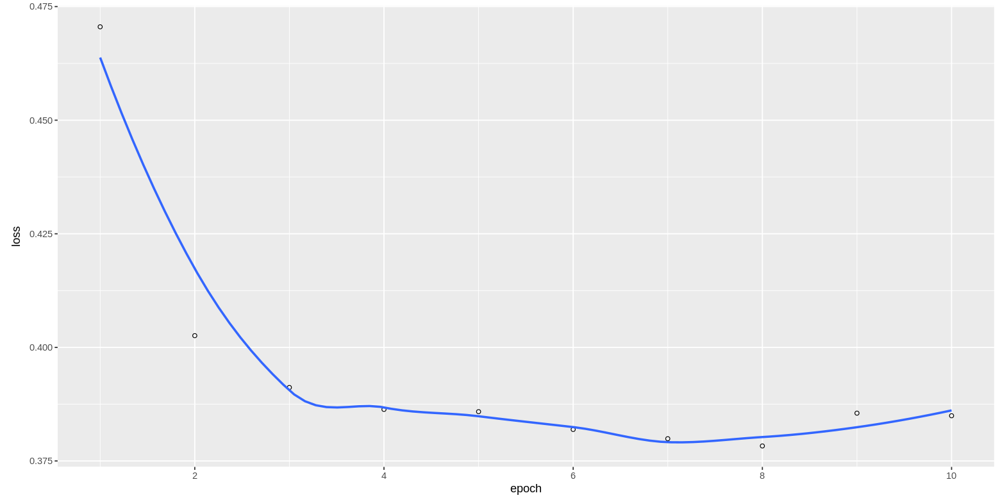

In [172]:
plot(history_lstm2)

#### Previsione

In [ ]:
pred_out_lstm2 <- model_lstm2 %>%
  predict(x.test,
          batch_size = batch.size)

#### Grafico di Previsione

Warning message:
“Removed 168 row(s) containing missing values (geom_path).”


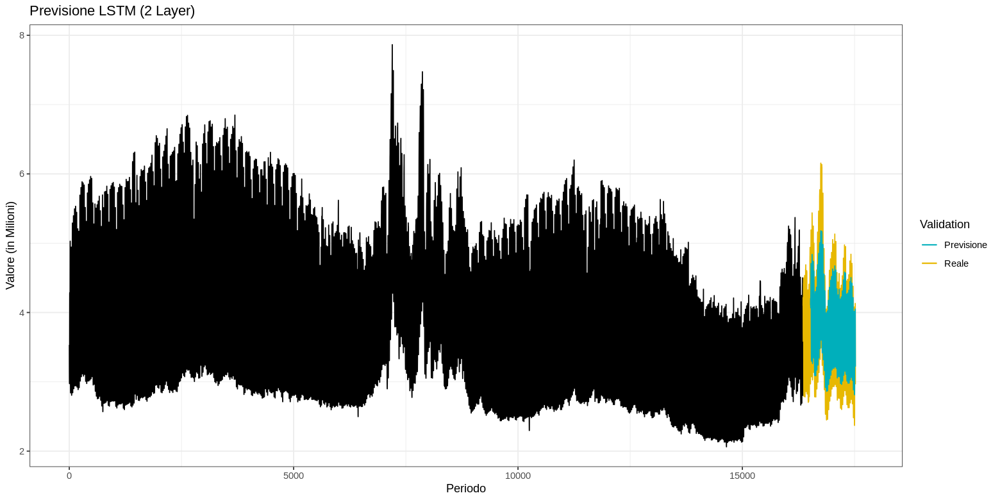

In [173]:
autoplot(ts(df_train, start = 1),
         main = "Previsione LSTM (2 Layer)",    #-- Titolo
         xlab = "Periodo",                      #-- Label X
         ylab = "Valore (in Milioni)")        + #-- Label Y
  autolayer(ts(df_val, start = 16352),                   
            series = "Reale")                 + #-- Validation
  autolayer(ts(pred_out_lstm2,
               start = (16352 + datalags)),
            series = "Previsione")            + #-- Previsione
  scale_y_continuous(breaks = c(-2, 0, 2, 4),   
                     labels = c(2, 4, 6, 8))  + #-- Interruzioni
  scale_color_manual(values = c("#00AFBB",
                                "#E7B800",
                                "#FC4E07"))   + #-- Colori
  labs(color = "Validation")                  + #-- Legenda
  theme_bw()                                    #-- Tema

#### Mean Absolute Error

In [174]:
mae_lstm2 <- colMeans(drop_na(as.data.frame(abs(df_val - pred_out_lstm2))))
names(mae_lstm2) <- c("LSTM_2")
mae_lstm2

LSTM_2 
0.398657

### 5. GRU

#### Costruzione Modello

In [ ]:
mod_gru1 <- keras_model_sequential()
mod_gru1 %>%
  layer_gru(units             = 20,             #-- Numero Neuroni 
            input_shape       = c(datalags, 1), #-- Dimensione Input
            batch_size        = batch.size,
            dropout           = 0.3,
            recurrent_dropout = 0.5) %>%
  layer_dense(units      = 1,
              activation = "linear")

#### Compilazione

In [177]:
mod_gru1 %>% 
  compile(loss = 'mae',       #-- Funzione di Perdita
          optimizer = 'adam') #-- Ottimizzatore

mod_gru1  

Model
Model: "sequential_5"
________________________________________________________________________________
Layer (type)                        Output Shape                    Param #     
gru (GRU)                           (73, 20)                        1320        
________________________________________________________________________________
dense_5 (Dense)                     (73, 1)                         21          
Total params: 1,341
Trainable params: 1,341
Non-trainable params: 0
________________________________________________________________________________



#### Addestramento

In [ ]:
history_gru1 <- mod_gru1 %>%
  fit(x          = x.train,    #-- Train
      y          = y.train,    #-- Test
      epochs     = 25,         #-- Epoche di Addestramento
      batch_size = batch.size,
      verbose    = 0,
      shuffle    = FALSE)

#### Funzione di Perdita

`geom_smooth()` using formula 'y ~ x'



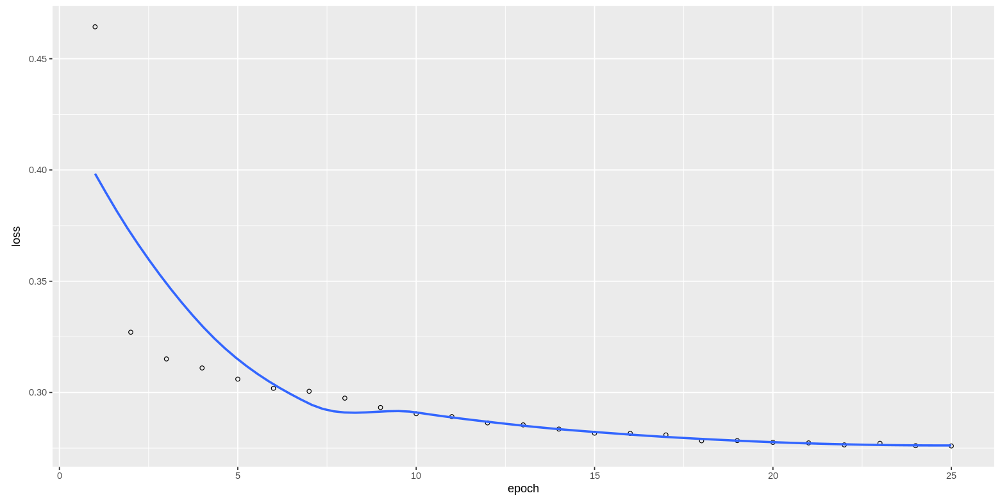

In [178]:
plot(history_gru1)

#### Previsione

In [ ]:
pred_out_gru1 <- mod_gru1 %>%
  predict(x.test,
          batch_size = batch.size)

#### Grafico di Previsione

Warning message:
“Removed 168 row(s) containing missing values (geom_path).”


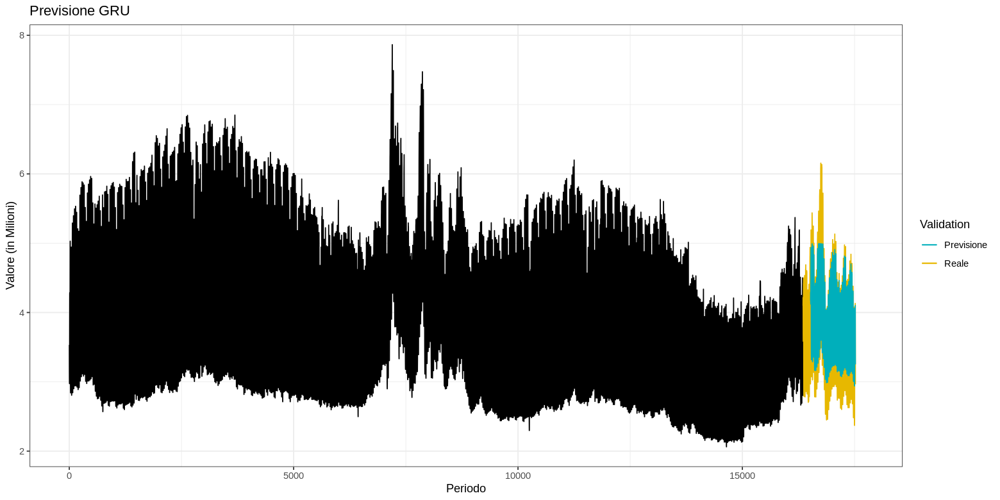

In [179]:
autoplot(ts(df_train, start = 1),
         main = "Previsione GRU",    #-- Titolo
         xlab = "Periodo",                      #-- Label X
         ylab = "Valore (in Milioni)")        + #-- Label Y
  autolayer(ts(df_val, start = 16352),                   
            series = "Reale")                 + #-- Validation
  autolayer(ts(pred_out_gru1,
               start = (16352 + datalags)),
            series = "Previsione")            + #-- Previsione
  scale_y_continuous(breaks = c(-2, 0, 2, 4),   
                     labels = c(2, 4, 6, 8))  + #-- Interruzioni
  scale_color_manual(values = c("#00AFBB",
                                "#E7B800",
                                "#FC4E07"))   + #-- Colori
  labs(color = "Validation")                  + #-- Legenda
  theme_bw()                                    #-- Tema

#### Mean Absolute Error

In [180]:
mae_gru1 <- colMeans(drop_na(as.data.frame(abs(df_val - pred_out_gru1))))
names(mae_gru1) <- c("GRU_1")
mae_gru1

GRU_1 
0.4176185

### Salvataggio Modelli

In [ ]:
save_model_hdf5(model_lstm1, "model_lstm1.h5")
save_model_hdf5(model_lstm2, "model_lstm2.h5")
save_model_hdf5(mod_gru1, "model_gru1.h5")

### Previsione Test Modello Migliore (ML)

In [181]:
mae_ml_val <- rbind(mae_knn,     #-- K-NN Week
                    mae_knn_day, #-- K-NN Day
                    mae_lstm1,   #-- LSTM 1 Layer
                    mae_lstm2,   #-- LSTM 2 Layer
                    mae_gru1)    #-- GRU

mae_ml_train <- rbind(mae_knn_week_train,
                          mae_knn_day_train,
                          history_lstm1$metrics$loss[epochs],
                          history_lstm1$metrics$loss[epochs],
                          history_gru1$metrics$loss[25])

mae_ml <- cbind(mae_ml_train,
                mae_ml_val)

colnames(mae_ml) <- c("Train",
                      "Validation")
rownames(mae_ml) <- c("K-NN Week",
                      "K-NN Day",
                      "LSTM 1 Layer",
                      "LSTM 2 Layer",
                      "GRU")
mae_ml

,Train,Validation
K-NN Week,0.2549024,0.5424770
K-NN Day,0.2549024,0.4345685
LSTM 1 Layer,0.2589685,0.4628556
LSTM 2 Layer,0.2589685,0.3986570
GRU,0.2759651,0.4176185


#### Scomposizione Train e Test

In [ ]:
train_best_lstm <- as.data.frame(ts_stand[seq(17520 + datalags)])

x.train_best <- array(data = lag(train_lstm$Valore, datalags)[ -(1 : datalags)],
                      dim = c(nrow(train_best_lstm) - datalags, datalags, 1))

y.train_best <- array(data = train_lstm$Valore[-(1:datalags)],
                      dim = c(nrow(train_best_lstm)-datalags, 1))

#### Costruzione Modello

In [ ]:
model_best_ml <- keras_model_sequential()
model_best_ml %>%
  layer_lstm(units            = 16,             #-- Numero Neuroni 
             input_shape      = c(datalags, 1), #-- Dimensione Input
             batch_size       = batch.size,
             return_sequences = TRUE,
             stateful         = TRUE) %>%       #-- Layer di tipo LSTM
  layer_dropout(rate = 0.5) %>%                 #-- Layer di Dropout
  layer_lstm(units            = 8,
             return_sequences = FALSE,
             stateful         = TRUE) %>%       #-- Layer di tipo LSTM
  layer_dropout(rate = 0.5) %>%                 #-- Layer di Dropout
  layer_dense(units = 1)                        #-- Layer Denso (Previsione)


#### Compilazione

In [182]:
model_best_ml %>%
  compile(loss = 'mae',       #-- Funzione di Perdita
          optimizer = 'adam') #-- Ottimizzatore

print(model_best_ml)

Model
Model: "sequential_6"
________________________________________________________________________________
Layer (type)                        Output Shape                    Param #     
lstm_8 (LSTM)                       (73, 168, 16)                   1152        
________________________________________________________________________________
dropout_5 (Dropout)                 (73, 168, 16)                   0           
________________________________________________________________________________
lstm_7 (LSTM)                       (73, 8)                         800         
________________________________________________________________________________
dropout_4 (Dropout)                 (73, 8)                         0           
________________________________________________________________________________
dense_6 (Dense)                     (73, 1)                         9           
Total params: 1,961
Trainable params: 1,961
Non-trainable params: 0
_____________

#### Addestramento

In [ ]:
history_best_ml <- model_best_ml %>%
  fit(x          = x.train_best,     #-- Train
      y          = y.train_best,     #-- Test
      epochs     = epochs,           #-- Epoche di Addestramento
      batch_size = batch.size,
      verbose    = 0,
      shuffle    = FALSE) 

#### Funzione di Perdita

`geom_smooth()` using formula 'y ~ x'



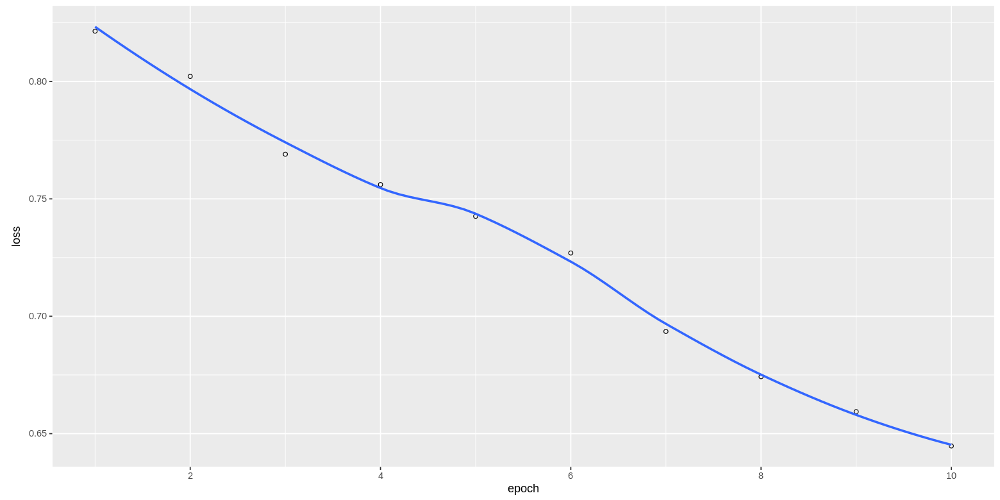

In [183]:
plot(history_best_ml)

#### Previsione

In [ ]:
pred_list <- c(tail(ts_stand, n = datalags))

for (single_value in c(1: 1464)){
  single_value <- pred_list[(length(pred_list)-datalags):length(pred_list)]
  single_value <- array_reshape(single_value, c(1, 1, datalags))
  single_pred <- model_best_ml %>%
    predict(single_value)
  
  #print(single_pred)
  pred_list <- append(single_pred)
}

#### Grafico di Previsione

In [ ]:
dyn_pred_best_ml <- xts::xts(x = pred_list,
                             order.by = fore)

dyn_pred_val_lstm2 <- xts::xts(x = unscale(pred_out_lstm2, ts_stand)[1:1000],
                               order.by = (ymdhms[(nrow(ts) - 999):nrow(ts)]))

all_ml <- cbind(dyn_ts,
                dyn_pred_val_lstm2,
                dyn_pred_best_ml)/1000000
colnames(all_ml) <- c("Reali",
                      "Validation",
                      "Previsione")

In [ ]:
dygraph(all_ml)                              %>%
  dySeries("Reali",
           label = "Reali")                  %>% #-- Train Dataset
  dySeries("Previsione",
           label = "Previsione")             %>% #-- Test Dataset
  dySeries("Validation",
           label = "Validation")             %>% #-- Validation Dataset
  dyOptions(drawPoints = TRUE,                   #-- Draw Points
            pointSize = 0.5,                     #-- Size of Points
            colors = c("blue",
                       "red",
                       "black"))             %>% #-- Colori
  dyAxis("y", label = "Valore (in Milioni)") %>% #-- Asse Y
  dyAxis("x", label = "Periodo",
         drawGrid = FALSE)                   %>% #-- Asse X
  dyRangeSelector(height = 20)               %>% #-- Slider 
  dyLegend(width = 350)                  

## Confronto Modelli Migliori

In [ ]:
all <- cbind(dyn_pred_best_arima,
             dyn_pred_best_ucm,
             dyn_pred_best_ml)/1000000
colnames(all) <- c("ARIMA",
                   "UCM",
                   "ML")

In [ ]:
dygraph(all)                                 %>%
  dySeries("ARIMA",
           label = "ARIMA")                  %>% #-- Train Dataset
  dySeries("UCM",
           label = "UCM")                    %>% #-- Test Dataset
  dySeries("ML",
           label = "ML")                     %>% #-- Validation Dataset
  dyOptions(drawPoints = TRUE,                   #-- Draw Points
            pointSize = 0.5,                     #-- Size of Points
            colors = c("blue",
                       "red",
                       "black"))             %>% #-- Colori
  dyAxis("y", label = "Valore (in Milioni)") %>% #-- Asse Y
  dyAxis("x", label = "Periodo",
         drawGrid = FALSE)                   %>% #-- Asse X
  dyRangeSelector(height = 20,
                  dateWindow = c("2020-09-01 1:00:00",
                                 "2020-09-08 1:00:00")) %>% #-- Slider 
  dyLegend(width = 350)

## Scrittura File

In [ ]:
df_date <- c()
df_hours <- c()
for (j in c(1:61)){
  for (i in c(1:24)){
    
    date <- as_date("2020-09-01") + j
    hours <- i
    
    df_date <- append(df_date, date)
    df_hours <- append(df_hours, hours)
  }
}

In [ ]:
test_data <- cbind(df_date,
                   df_hours,
                   pred_best_arima[1:(61*24)],
                   pred_best_ucm,
                   unscale(pred_out_best_ml[1:(61*24)],
                           ts_stand))

colnames(test_data) <- c("Data", "Ora",
                         "ARIMA", "UCM", "ML")

In [ ]:
write_csv2(as.data.frame(test_data),
           "G:\\Il mio Drive\\Università\\Data Science\\2° Anno\\Streaming Data Management and Time Series Analysis\\Esame\\calendar.csv")